### In this project I'm going to apply CRISP-DM(CRoss Industry Standard Process  Data mining) which contains 6 steps:

<br> Business Undestanding.
<br> Data Understanding.
<br> Preparing Data.
<br> Data Modeling.
<br> Evaluate Results.
<br> Deployment.

## Content

<a id = 'start'></a>

1. [Wrangling](#wrangling)
2. [Q1. Which Airbnb listings earn the most in Berlin? ](#question1)
   - [Price map by Berlin distrincts](#map)
  
3. [Q2. What Characteristics (Features) impact the price of Airnbnb listing in Berlin the most? ](#question2)
 - [Regression Model](#model1)
 - [OLS Model](#model2)
 - [XGBoost Model](#model3)
<br>=> [Results](#results)
4. [Q3. What highly rated neighbourhoods in Berlin have to offer ? Whhat description of highly priced places tell the customer? ](#question3)
 - [neighbourhoods Wordcloud](#neighbourhoods)
 - [highly priced places Wordcloud](#places)
5.  [Q4. What are those extraordinary highly profitable units and what makes them triple their monthly earnings in comparison to the rest nicely located listings? ](#question4)




<a id=wrangling></a>


## Wrangling


In [1]:
import pandas as pd
import numpy as np
%matplotlib inline 

In [2]:
import geojson
import plotly.express as px
import matplotlib.pyplot as plt 
import seaborn as sns

In [3]:
from sklearn.preprocessing import StandardScaler, MinMaxScaler 
from sklearn.model_selection import train_test_split, cross_val_score 
from sklearn.linear_model import LinearRegression
from sklearn import linear_model
from sklearn import metrics
import xgboost as xgb
from xgboost import plot_importance
from sklearn.metrics import explained_variance_score, mean_squared_error, r2_score

#Hide warnings
import warnings
warnings.filterwarnings('ignore')

### Loading data:

In [291]:
df_listings = pd.read_csv('/Users/katerynaisaieva/Desktop/Nanodegree_Projects/Data_Scientist_Nanodegree/Airbnb_project/Berlin/data/listings.csv')
df_listings.sample(50) 



,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
15292,46624413,Holiday 33 Apartment B next to Alexanderplatz,172232819,Holiday 33,Pankow,Prenzlauer Berg Süd,52.53207,13.42966,Entire home/apt,172,1,26,2021-11-28,3.01,6,291,26,First name and Last name: Haitao Long <br/> Co...
9133,25802565,Axel Single Room at TWO Hotel Berlin by Axel,187655517,TWO Hotel Berlin By Axel - Adults,Charlottenburg-Wilm.,Volkspark Wilmersdorf,52.48992,13.32959,Hotel room,62,1,8,2021-11-01,0.26,10,342,2,DE815656142
16833,52422387,Schönes Zimmer im Herzen Prenzlauer Bergs,120381682,Fernando,Pankow,Helmholtzplatz,52.54255,13.42444,Private room,80,2,4,2021-10-20,1.56,1,350,4,NaN
2384,6932795,Berliner holiday house in green garden with pool.,36345590,Isolde,Marzahn - Hellersdorf,Marzahn-Süd,52.51886,13.53371,Entire home/apt,55,3,137,2021-08-15,1.75,2,0,3,NaN
12357,37802777,Ruhige Zimmer Nähe ehemaligen Flughafen TXL,286093426,Karin,Reinickendorf,West 1,52.57186,13.28207,Private room,40,2,12,2021-11-07,0.43,1,89,7,NaN
7054,20182090,gemütliche Maisonette-Wohnung in Berlins Mitte,143679982,Frida,Mitte,Alexanderplatz,52.52830,13.40599,Entire home/apt,62,7,1,2017-09-23,0.02,1,0,0,NaN
7125,20294429,Cozy appartment for 2 close to Kreuzkölln,12376926,Clara,Treptow - Köpenick,Alt Treptow,52.49004,13.45602,Entire home/apt,24,14,1,2017-08-15,0.02,1,0,0,NaN
3726,10380465,Perfect place in Neukölln,16698845,Kristin,Neukölln,Reuterstraße,52.49157,13.43348,Private room,21,3,1,2016-04-28,0.01,1,0,0,NaN
15582,48256666,Sweet apartment in trendy Neukoelln,103359088,Mira,Neukölln,Reuterstraße,52.48288,13.43918,Entire home/apt,39,60,0,NaN,NaN,2,232,0,NaN
9109,25708499,"cosy, quiet stay right next to the Ufer",143660348,Jasmin,Neukölln,Reuterstraße,52.49175,13.42441,Entire home/apt,90,3,21,2021-12-04,0.53,1,15,6,08/Z/AZ/006648-18


In [292]:
df_listings.columns

Index(['id', 'name', 'host_id', 'host_name', 'neighbourhood_group',
       'neighbourhood', 'latitude', 'longitude', 'room_type', 'price',
       'minimum_nights', 'number_of_reviews', 'last_review',
       'reviews_per_month', 'calculated_host_listings_count',
       'availability_365', 'number_of_reviews_ltm', 'license'],
      dtype='object')

In [293]:
df_listings_gz = pd.read_csv('/Users/katerynaisaieva/Desktop/Nanodegree_Projects/Data_Scientist_Nanodegree/Airbnb_project/Berlin/data/listings.csv.gz')
df_listings_gz.head(2) 


,id,listing_url,scrape_id,last_scraped,name,description,neighborhood_overview,picture_url,host_id,host_url,...,review_scores_communication,review_scores_location,review_scores_value,license,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
0,2015,https://www.airbnb.com/rooms/2015,20211217003618,2021-12-17,Berlin-Mitte Value! Quiet courtyard/very central,Great location! <br />30 of 75 sq meters. Thi...,It is located in the former East Berlin area o...,https://a0.muscache.com/pictures/260fd609-710a...,2217,https://www.airbnb.com/users/show/2217,...,4.90,4.96,4.58,NaN,f,4,4,0,0,2.08
1,3176,https://www.airbnb.com/rooms/3176,20211217003618,2021-12-17,Fabulous Flat in great Location,This beautiful first floor apartment is situa...,The neighbourhood is famous for its variety of...,https://a0.muscache.com/pictures/243355/84afcf...,3718,https://www.airbnb.com/users/show/3718,...,4.69,4.92,4.63,NaN,f,1,1,0,0,0.97


In [294]:
df_listings_gz.columns

Index(['id', 'listing_url', 'scrape_id', 'last_scraped', 'name', 'description',
       'neighborhood_overview', 'picture_url', 'host_id', 'host_url',
       'host_name', 'host_since', 'host_location', 'host_about',
       'host_response_time', 'host_response_rate', 'host_acceptance_rate',
       'host_is_superhost', 'host_thumbnail_url', 'host_picture_url',
       'host_neighbourhood', 'host_listings_count',
       'host_total_listings_count', 'host_verifications',
       'host_has_profile_pic', 'host_identity_verified', 'neighbourhood',
       'neighbourhood_cleansed', 'neighbourhood_group_cleansed', 'latitude',
       'longitude', 'property_type', 'room_type', 'accommodates', 'bathrooms',
       'bathrooms_text', 'bedrooms', 'beds', 'amenities', 'price',
       'minimum_nights', 'maximum_nights', 'minimum_minimum_nights',
       'maximum_minimum_nights', 'minimum_maximum_nights',
       'maximum_maximum_nights', 'minimum_nights_avg_ntm',
       'maximum_nights_avg_ntm', 'calendar_upd

In [295]:
df_listings_gz['amenities'][23] #"Wifi", "Kitchen", "Dedicated workspace: office chair and desk"

'["Essentials", "Drying rack for clothing", "Long term stays allowed", "Microwave", "Stove", "Toaster", "Cooking basics", "Free washer \\u2013 In building", "Smoke alarm", "Kitchen", "Dishes and silverware", "Hot water kettle", "Hair dryer", "Cleaning before checkout", "Bed linens", "Host greets you", "Dedicated workspace: office chair and desk", "Hot water", "Refrigerator", "Iron", "Hangers", "Wifi", "Clothing storage: wardrobe", "Portable fans", "Central heating", "Paid parking off premises"]'

In [296]:
df_listings_gz['amenities']

0        ["Essentials", "Heating", "Backyard", "Long te...
1        ["Essentials", "Heating", "Smoke alarm", "Iron...
2        ["Essentials", "Heating", "Refrigerator", "Hai...
3        ["Essentials", "Children\u2019s dinnerware", "...
4        ["Ethernet connection", "Heating", "Coffee mak...
                               ...                        
17285    ["Heating", "Smoke alarm", "Iron", "Washer", "...
17286    ["Essentials", "Heating", "Baking sheet", "Fre...
17287    ["Fire extinguisher", "Smoke alarm", "Washer",...
17288    ["Smoke alarm", "Washer", "Kitchen", "Dedicate...
17289    ["Essentials", "Heating", "Smoke alarm", "Iron...
Name: amenities, Length: 17290, dtype: object

In [297]:
df_calendar = pd.read_csv('/Users/katerynaisaieva/Desktop/Nanodegree_Projects/Data_Scientist_Nanodegree/Airbnb_project/Berlin/data/calendar.csv.gz')
df_calendar.head(2) 



,listing_id,date,available,price,adjusted_price,minimum_nights,maximum_nights
0,2015,2021-12-17,f,$59.00,$59.00,12.0,1125.0
1,2015,2021-12-18,f,$59.00,$59.00,12.0,1125.0


In [298]:
df_reviews = pd.read_csv('/Users/katerynaisaieva/Desktop/Nanodegree_Projects/Data_Scientist_Nanodegree/Airbnb_project/Berlin/data/reviews.csv')
df_reviews.sample(5) 



,listing_id,date
78082,2483206,2016-08-29
25283,425411,2020-12-01
20558,321295,2021-07-24
24338,400832,2019-10-02
409599,50533736,2021-07-11


In [299]:
df_reviews_gz = pd.read_csv('/Users/katerynaisaieva/Desktop/Nanodegree_Projects/Data_Scientist_Nanodegree/Airbnb_project/Berlin/data/reviews.csv.gz')
df_reviews_gz.sample(5) 


,listing_id,id,date,reviewer_id,reviewer_name,comments
184751,13044693,108940706,2016-10-18,16612586,Chiara,L'appartamento di Anne e Judith è bellissimo! ...
165571,11078656,422869809,2019-03-12,100130471,Francesca,Perfect studio apartment for a few nights. In ...
235525,17613424,249358209,2018-04-02,16352746,Irene,Everything is so good and we felt very comfort...
4309,80843,270827646,2018-05-30,29552030,Jutta,Excellent location and easy access to public t...
211548,15660868,724337480,2021-01-15,2843318,Lauren & Roman,Lovely apartment with lots of wonderful detail...


In [300]:
df_neighbourhoods = pd.read_csv('/Users/katerynaisaieva/Desktop/Nanodegree_Projects/Data_Scientist_Nanodegree/Airbnb_project/Berlin/data/neighbourhoods.csv')
df_neighbourhoods.head(5) 


,neighbourhood_group,neighbourhood
0,Charlottenburg-Wilm.,Barstraße
1,Charlottenburg-Wilm.,Charlottenburg Nord
2,Charlottenburg-Wilm.,Düsseldorfer Straße
3,Charlottenburg-Wilm.,Forst Grunewald
4,Charlottenburg-Wilm.,Grunewald


In [301]:
# path = '/Users/katerynaisaieva/Desktop/Nanodegree_Projects/Data_Scientist_Nanodegree/Airbnb_project/Berlin/data/neighbourhoods.geojson'
# with open(path) as f:
#     df_bezirk = geojson.load(f)
# features = df_bezirk['features'][0]



In [302]:
#df_bezirk

### Cleaning datasets:

#### df_listings dataset:

- column last_review - change string type to datetime
- column lisence - replace NaN values with 'no' and others with 'yes'
- column name, host_name - replace NaN values with empty string
- column reviews_per_month - replace NaN with 0 , since it seems like they just dont have reviews yet
- column last_revies - keep NaN foe now

- extend with extra columns from df_listings_gz by merging datasets

In [303]:
df_listings.shape

(17290, 18)

In [304]:
df_listings.isnull().sum()

id                                    0
name                                 28
host_id                               0
host_name                            11
neighbourhood_group                   0
neighbourhood                         0
latitude                              0
longitude                             0
room_type                             0
price                                 0
minimum_nights                        0
number_of_reviews                     0
last_review                        3248
reviews_per_month                  3248
calculated_host_listings_count        0
availability_365                      0
number_of_reviews_ltm                 0
license                           13058
dtype: int64

In [305]:
df_listings.info() 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17290 entries, 0 to 17289
Data columns (total 18 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              17290 non-null  int64  
 1   name                            17262 non-null  object 
 2   host_id                         17290 non-null  int64  
 3   host_name                       17279 non-null  object 
 4   neighbourhood_group             17290 non-null  object 
 5   neighbourhood                   17290 non-null  object 
 6   latitude                        17290 non-null  float64
 7   longitude                       17290 non-null  float64
 8   room_type                       17290 non-null  object 
 9   price                           17290 non-null  int64  
 10  minimum_nights                  17290 non-null  int64  
 11  number_of_reviews               17290 non-null  int64  
 12  last_review                     

In [306]:
df_listings.last_review = pd.to_datetime(df_listings.last_review)
df_listings['license'].loc[~df_listings['license'].isnull()] = 'yes'
df_listings.license = df_listings.license.fillna('no')

In [307]:
df_listings.name = df_listings.name.fillna('')
df_listings.host_name = df_listings.host_name.fillna('')
df_listings.reviews_per_month = df_listings.reviews_per_month.fillna(0)

In [308]:
df_listings.isnull().sum()

id                                   0
name                                 0
host_id                              0
host_name                            0
neighbourhood_group                  0
neighbourhood                        0
latitude                             0
longitude                            0
room_type                            0
price                                0
minimum_nights                       0
number_of_reviews                    0
last_review                       3248
reviews_per_month                    0
calculated_host_listings_count       0
availability_365                     0
number_of_reviews_ltm                0
license                              0
dtype: int64

In [309]:
df_listings.sample(2)

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
12186,37156504,Appartamento pulito ed ordinato.. soggiorni brevi,275087561,Shqiponje,Pankow,Prenzlauer Berg Nord,52.54990,13.42318,Private room,75,1,0,NaT,0.00,1,0,0,no
16836,52439012,Central modern Apartment in Berlin Mitte,93344008,Mo,Mitte,Alexanderplatz,52.53627,13.37269,Entire home/apt,107,4,3,2021-11-24,1.27,1,78,3,yes


In [310]:
df_listings_gz.iloc[:3,:6]

,id,listing_url,scrape_id,last_scraped,name,description
0,2015,https://www.airbnb.com/rooms/2015,20211217003618,2021-12-17,Berlin-Mitte Value! Quiet courtyard/very central,Great location! <br />30 of 75 sq meters. Thi...
1,3176,https://www.airbnb.com/rooms/3176,20211217003618,2021-12-17,Fabulous Flat in great Location,This beautiful first floor apartment is situa...
2,7071,https://www.airbnb.com/rooms/7071,20211217003618,2021-12-17,BrightRoom with sunny greenview!,Cozy and large room in the beautiful district ...


In [311]:
df_listings_gz.iloc[:3,6:8].loc[2]

neighborhood_overview    Great neighborhood with plenty of Cafés, Baker...
picture_url              https://a0.muscache.com/pictures/21278/32a1622...
Name: 2, dtype: object

In [312]:
df_listings_gz.iloc[:3,1:60]

,listing_url,scrape_id,last_scraped,name,description,neighborhood_overview,picture_url,host_id,host_url,host_name,...,availability_30,availability_60,availability_90,availability_365,calendar_last_scraped,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,first_review,last_review
0,https://www.airbnb.com/rooms/2015,20211217003618,2021-12-17,Berlin-Mitte Value! Quiet courtyard/very central,Great location! <br />30 of 75 sq meters. Thi...,It is located in the former East Berlin area o...,https://a0.muscache.com/pictures/260fd609-710a...,2217,https://www.airbnb.com/users/show/2217,Ion,...,28,58,64,326,2021-12-17,144,10,0,2016-04-11,2021-11-02
1,https://www.airbnb.com/rooms/3176,20211217003618,2021-12-17,Fabulous Flat in great Location,This beautiful first floor apartment is situa...,The neighbourhood is famous for its variety of...,https://a0.muscache.com/pictures/243355/84afcf...,3718,https://www.airbnb.com/users/show/3718,Britta,...,0,0,0,170,2021-12-17,147,1,0,2009-06-20,2021-01-01
2,https://www.airbnb.com/rooms/7071,20211217003618,2021-12-17,BrightRoom with sunny greenview!,Cozy and large room in the beautiful district ...,"Great neighborhood with plenty of Cafés, Baker...",https://a0.muscache.com/pictures/21278/32a1622...,17391,https://www.airbnb.com/users/show/17391,BrightRoom,...,0,0,0,0,2021-12-17,293,0,0,2009-08-18,2020-03-31


In [313]:
df_listings_gz.isnull().sum()[:60]

id                                  0
listing_url                         0
scrape_id                           0
last_scraped                        0
name                               28
description                       455
neighborhood_overview            8230
picture_url                         0
host_id                             0
host_url                            0
host_name                          11
host_since                         11
host_location                      51
host_about                       8737
host_response_time               9281
host_response_rate               9281
host_acceptance_rate             8256
host_is_superhost                  11
host_thumbnail_url                 11
host_picture_url                   11
host_neighbourhood               5850
host_listings_count                11
host_total_listings_count          11
host_verifications                  0
host_has_profile_pic               11
host_identity_verified             11
neighbourhoo

In [314]:
df_listings_gz.shape

(17290, 74)

In [315]:
# left join df_listings_gz dataset  to get columns:
# - 'host_has_profile_pic' 
# - 'host_identity_verified' 
# -  host_is_superhost
# - host_since 
columns = ['id','property_type','description',
'neighborhood_overview','accommodates','bedrooms','bathrooms', 'beds','has_availability','maximum_nights',
       'availability_30', 'availability_60', 'availability_90',
       'review_scores_accuracy','review_scores_rating',
       'review_scores_cleanliness', 'review_scores_checkin',
       'review_scores_communication', 'review_scores_location',
       'review_scores_value','calculated_host_listings_count_entire_homes','calculated_host_listings_count_private_rooms','calculated_host_listings_count_shared_rooms'
]

df_listings = df_listings.merge(df_listings_gz[columns], how = 'left', left_on = 'id', right_on = 'id',)



In [316]:
# filling NaN values
df_listings.description = df_listings.description.fillna('')
df_listings.neighborhood_overview = df_listings.neighborhood_overview.fillna('')


In [317]:
df_listings.bedrooms = df_listings.bedrooms.fillna(df_listings.bedrooms.mean())
df_listings.beds = df_listings.beds.fillna(df_listings.beds.mean())
df_listings = df_listings.drop(['bathrooms','last_review'],axis=1)

In [318]:
df_listings.review_scores_rating = df_listings.review_scores_rating.fillna(df_listings.review_scores_rating.mean())
df_listings.review_scores_location = df_listings.review_scores_location.fillna(df_listings.review_scores_location.mean())

df_listings.review_scores_accuracy = df_listings.review_scores_accuracy.fillna(df_listings.review_scores_accuracy.mean())
df_listings.review_scores_cleanliness = df_listings.review_scores_cleanliness.fillna(df_listings.review_scores_cleanliness.mean())

df_listings.review_scores_communication = df_listings.review_scores_communication.fillna(df_listings.review_scores_communication.mean())
df_listings.review_scores_checkin = df_listings.review_scores_checkin.fillna(df_listings.review_scores_checkin.mean())
df_listings.review_scores_value = df_listings.review_scores_value.fillna(df_listings.review_scores_value.mean())


In [319]:
df_listings.shape

(17290, 38)

In [320]:
df_listings.isnull().sum()

id                                              0
name                                            0
host_id                                         0
host_name                                       0
neighbourhood_group                             0
neighbourhood                                   0
latitude                                        0
longitude                                       0
room_type                                       0
price                                           0
minimum_nights                                  0
number_of_reviews                               0
reviews_per_month                               0
calculated_host_listings_count                  0
availability_365                                0
number_of_reviews_ltm                           0
license                                         0
property_type                                   0
description                                     0
neighborhood_overview                           0


### defining accomodation type:

In [321]:
df_listings['accomodation_type'] = ''
for row in range(df_listings.shape[0]):
    if (df_listings.calculated_host_listings_count_entire_homes[row] != 0) and (df_listings.calculated_host_listings_count_private_rooms[row] == 0) :
        df_listings.loc[row,'accomodation_type'] = 'entire_home'
    elif  (df_listings.calculated_host_listings_count_entire_homes[row] == 0) and (df_listings.calculated_host_listings_count_private_rooms[row] != 0):
         df_listings.loc[row,'accomodation_type'] = 'private_room'
    elif  df_listings.calculated_host_listings_count_shared_rooms[row] != 0 :
        df_listings.loc[row,'accomodation_type'] = 'shared_room'
    elif (df_listings.calculated_host_listings_count_shared_rooms[row] != 0)  and (df_listings.calculated_host_listings_count_entire_homes[row] != 0) and (df_listings.calculated_host_listings_count_private_rooms[row] != 0) :
        df_listings.loc[row,'accomodation_type'] = 'other'
    elif  (df_listings.calculated_host_listings_count_entire_homes[row] != 0) and (df_listings.calculated_host_listings_count_private_rooms[row] != 0):        
        df_listings.loc[row,'accomodation_type'] = 'entire home & private_room'
        
        

In [322]:
columns = ['calculated_host_listings_count',
'calculated_host_listings_count_entire_homes',
'calculated_host_listings_count_private_rooms',
'calculated_host_listings_count_shared_rooms' ]
#df_listings = df_listings.drop(columns, axis=1)

In [323]:
df_listings.columns

Index(['id', 'name', 'host_id', 'host_name', 'neighbourhood_group',
       'neighbourhood', 'latitude', 'longitude', 'room_type', 'price',
       'minimum_nights', 'number_of_reviews', 'reviews_per_month',
       'calculated_host_listings_count', 'availability_365',
       'number_of_reviews_ltm', 'license', 'property_type', 'description',
       'neighborhood_overview', 'accommodates', 'bedrooms', 'beds',
       'has_availability', 'maximum_nights', 'availability_30',
       'availability_60', 'availability_90', 'review_scores_accuracy',
       'review_scores_rating', 'review_scores_cleanliness',
       'review_scores_checkin', 'review_scores_communication',
       'review_scores_location', 'review_scores_value',
       'calculated_host_listings_count_entire_homes',
       'calculated_host_listings_count_private_rooms',
       'calculated_host_listings_count_shared_rooms', 'accomodation_type'],
      dtype='object')

In [324]:
df_listings.sample(2)

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,...,review_scores_rating,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,accomodation_type
7294,20632060,Modern and Spacious Flat in East Berlin w/ Bal...,118974643,Karo,Lichtenberg,Alt-Lichtenberg,52.51622,13.48183,Private room,70,...,4.57,4.71,5.00,5.00,4.86,4.43,0,1,0,private_room
10546,30877194,FL@T the PARK,105120824,Pepper,Treptow - Köpenick,Plänterwald,52.48342,13.46307,Entire home/apt,90,...,4.33,4.22,4.67,4.67,4.33,4.33,1,0,0,entire_home


### df_calendar dataset:

In [325]:
df_calendar.shape

(6310491, 7)

In [326]:
df_calendar.isnull().sum()

listing_id          0
date                0
available           0
price             194
adjusted_price    194
minimum_nights     17
maximum_nights     17
dtype: int64

In [327]:
# removing rows which have NaN values
df_calendar = df_calendar.dropna(axis = 0, how = 'any')

In [328]:
df_calendar.isnull().sum()

listing_id        0
date              0
available         0
price             0
adjusted_price    0
minimum_nights    0
maximum_nights    0
dtype: int64

In [329]:
df_calendar.shape

(6310280, 7)

In [330]:
df_calendar.sort_values(by=['listing_id','date']).head(10)

,listing_id,date,available,price,adjusted_price,minimum_nights,maximum_nights
0,2015,2021-12-17,f,$59.00,$59.00,12.0,1125.0
1,2015,2021-12-18,f,$59.00,$59.00,12.0,1125.0
2,2015,2021-12-19,t,$44.00,$44.00,12.0,1125.0
3,2015,2021-12-20,t,$44.00,$44.00,12.0,1125.0
4,2015,2021-12-21,t,$54.00,$54.00,12.0,1125.0
5,2015,2021-12-22,t,$54.00,$54.00,12.0,1125.0
6,2015,2021-12-23,t,$54.00,$54.00,12.0,1125.0
7,2015,2021-12-24,t,$54.00,$54.00,12.0,1125.0
8,2015,2021-12-25,t,$59.00,$59.00,12.0,1125.0
9,2015,2021-12-26,t,$54.00,$54.00,12.0,1125.0


In [331]:
df_calendar[(df_calendar.listing_id == 2015)&(df_calendar.available=='t')].count()

listing_id        326
date              326
available         326
price             326
adjusted_price    326
minimum_nights    326
maximum_nights    326
dtype: int64

In [332]:
df_listings.sample(4)

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,...,review_scores_rating,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,accomodation_type
4571,13276162,2-Zimmerwohnung mit guter Verkehrsanbindung,74694342,Anja,Steglitz - Zehlendorf,Zehlendorf Südwest,52.42371,13.20361,Entire home/apt,90,...,4.92,4.88,4.91,5.00,4.74,4.74,1,0,0,entire_home
9078,25502550,Lovely apartment with a balcony in Friedrichshain,192455794,Michael,Pankow,Prenzlauer Berg Ost,52.52289,13.45578,Entire home/apt,168,...,4.75,4.83,5.00,4.83,4.25,4.33,1,0,0,entire_home
7552,21129156,Studio in Reichenbergerstr/ Kreuzberg,13783177,Elisabeth,Friedrichshain-Kreuzberg,südliche Luisenstadt,52.49504,13.42779,Entire home/apt,30,...,4.67,4.83,5.00,5.00,4.83,4.33,11,0,0,entire_home
8049,22217946,Cosy spacious flat in the heart of Friedrichshain,134486558,Mariya,Friedrichshain-Kreuzberg,Frankfurter Allee Süd FK,52.51423,13.45535,Entire home/apt,85,...,5.00,4.86,5.00,5.00,5.00,4.71,1,0,0,entire_home


<a id='question1'></a>
## Buisness question 1.  
## Which Airbnb listings earn the most in Berlin?   =>   (has highest price per night, most popular, by unit type and size )

[back to start](#start)

### Q1.1:  Apartments in which area have a highest average/medium price per night tariff?

#### Number of unique listings scrapped on date 20 March 2022, over period of  ('2021-12-17', '2022-12-18'):

In [333]:
df_listings.id.nunique()

17290

In [334]:
df_calendar.date.min(), df_calendar.date.max()

('2021-12-17', '2022-12-18')

In [335]:
df_listings.accomodation_type.unique()

array(['entire_home', 'private_room', 'entire home & private_room',
       'shared_room', ''], dtype=object)

In [336]:
fig = px.histogram(df_listings, x="price", title = 'Price distribution (euro)')
fig.show();

In [337]:
fig = px.histogram(df_listings, x="price", title = 'Price distribution (euro)')
fig.show();

In [338]:
# look at breakdown of prices in different districts
avg_price = df_listings.groupby('neighbourhood_group').agg({'price':['mean',
                                                                  'median','std','count']})

In [339]:
avg_price

price                         
                               mean median         std count
neighbourhood_group                                         
Charlottenburg-Wilm.      81.640932   60.0  104.227318  1373
Friedrichshain-Kreuzberg  75.801776   55.0  230.770415  3829
Lichtenberg               63.755396   47.5   75.246846   556
Marzahn - Hellersdorf     70.669492   55.0   59.267474   118
Mitte                     85.770242   60.0  101.823489  3804
Neukölln                  56.534541   45.0   91.255361  2374
Pankow                    78.868519   61.0  109.050043  2700
Reinickendorf             55.336066   45.0   62.480365   244
Spandau                   79.480916   59.0   66.057126   131
Steglitz - Zehlendorf     73.490566   50.0   94.332315   371
Tempelhof - Schöneberg    76.709137   58.0  134.481767  1193
Treptow - Köpenick        66.750419   55.0   49.828697   597

### => There is number of highly priced unites, which is rather rare extraordinary pricy places. In this Analysis I won't take them into consideration. Therefore units which are priced > 500 will be removed from dataset.

In [340]:
df_listings_original = df_listings.copy()
df_listings = df_listings[df_listings.price <= 500]

In [341]:
fig = px.histogram(df_listings, x="price", title = 'Price distribution (euro)')
fig.show()

In [342]:
entire_home_price = df_listings[df_listings.accomodation_type == 'entire_home'].groupby('neighbourhood_group').price.mean().sort_values(ascending=False).round(2)
entire_home_price

neighbourhood_group
Mitte                       99.21
Spandau                     99.19
Marzahn - Hellersdorf       92.94
Pankow                      90.56
Charlottenburg-Wilm.        90.28
Friedrichshain-Kreuzberg    87.25
Tempelhof - Schöneberg      83.78
Steglitz - Zehlendorf       80.50
Treptow - Köpenick          79.83
Lichtenberg                 76.73
Neukölln                    70.92
Reinickendorf               63.05
Name: price, dtype: float64

In [343]:
round(df_listings[df_listings.accomodation_type == 'entire_home'].price.mean(),2)



87.88

In [344]:
df_entire_home_price = pd.DataFrame(entire_home_price)
df_entire_home_price = df_entire_home_price.sort_values('price',ascending = True)
df_entire_home_price

,price
neighbourhood_group,
Reinickendorf,63.05
Neukölln,70.92
Lichtenberg,76.73
Treptow - Köpenick,79.83
Steglitz - Zehlendorf,80.50
Tempelhof - Schöneberg,83.78
Friedrichshain-Kreuzberg,87.25
Charlottenburg-Wilm.,90.28
Pankow,90.56


In [345]:

print(px.colors.qualitative.T10)

['#4C78A8', '#F58518', '#E45756', '#72B7B2', '#54A24B', '#EECA3B', '#B279A2', '#FF9DA6', '#9D755D', '#BAB0AC']


In [346]:
import plotly.graph_objects as go

fig = go.Figure(go.Bar(
            x=df_entire_home_price.price,
            y=df_entire_home_price.index,
     text = df_entire_home_price.price,
            orientation='h',
marker_color = '#FF9DA6'))

fig.update_layout(height=400, width=600, title_text="Entire home: Average price by area (euro)",
                      xaxis_title="customer share affected(%)", paper_bgcolor='rgba(0,0,0,0)',
                      plot_bgcolor='rgba(0,0,0,0)'
                      )
fig.show()

In [347]:
private_room = df_listings[df_listings.accomodation_type == 'private_room'].groupby('neighbourhood_group').price.mean().sort_values(ascending=False).round(2)
private_room = pd.DataFrame(private_room).sort_values('price',ascending=True)

private_room

,price
neighbourhood_group,
Neukölln,37.36
Spandau,37.50
Reinickendorf,39.89
Lichtenberg,39.96
Friedrichshain-Kreuzberg,41.94
Marzahn - Hellersdorf,43.30
Steglitz - Zehlendorf,44.03
Treptow - Köpenick,44.25
Pankow,46.01


In [348]:
round(df_listings[df_listings.accomodation_type == 'private_room'].price.mean(),2)

43.81

In [349]:
fig = go.Figure(go.Bar(
            x=private_room.price,
            y=private_room.index,
     text = private_room.price,
            orientation='h',
marker_color = '#BAB0AC'))

fig.update_layout(height=400, width=600, title_text="Private room: Average price by area (euro)",
                      xaxis_title="customer share affected(%)", paper_bgcolor='rgba(0,0,0,0)',
                      plot_bgcolor='rgba(0,0,0,0)'
                      )
fig.show()

In [350]:
shared_room = df_listings[df_listings.accomodation_type == 'shared_room'].groupby('neighbourhood_group').price.mean().sort_values(ascending=False).round(2)
shared_room = pd.DataFrame(shared_room).sort_values('price',ascending=True)
shared_room

,price
neighbourhood_group,
Treptow - Köpenick,16.75
Lichtenberg,24.91
Marzahn - Hellersdorf,25.00
Reinickendorf,41.00
Friedrichshain-Kreuzberg,43.67
Spandau,50.00
Mitte,50.91
Charlottenburg-Wilm.,50.92
Tempelhof - Schöneberg,51.40


In [351]:
round(df_listings[df_listings.accomodation_type == 'shared_room'].price.mean(),2)



49.85

In [352]:
fig = go.Figure(go.Bar(
            x=shared_room.price,
            y=shared_room.index,
     text = shared_room.price,
            orientation='h',
marker_color = '#9D755D'))

fig.update_layout(height=400, width=600, title_text="Shared room: Average price by area (euro)",
                      xaxis_title="customer share affected(%)", paper_bgcolor='rgba(0,0,0,0)',
                      plot_bgcolor='rgba(0,0,0,0)'
                      )
fig.show()

In [353]:
hotel_room = df_listings[df_listings.room_type == 'Hotel room'].groupby('neighbourhood_group').price.mean().sort_values(ascending=False).round(2)
hotel_room = pd.DataFrame(hotel_room).sort_values('price',ascending=True)
hotel_room


,price
neighbourhood_group,
Treptow - Köpenick,0.00
Marzahn - Hellersdorf,89.00
Lichtenberg,99.62
Tempelhof - Schöneberg,117.83
Mitte,128.67
Pankow,129.72
Spandau,157.75
Charlottenburg-Wilm.,162.11
Friedrichshain-Kreuzberg,162.56


In [354]:
round(df_listings[df_listings.room_type == 'Hotel room'].price.mean(),2)


134.96

In [355]:
fig = go.Figure(go.Bar(
            x=hotel_room.price,
            y=hotel_room.index,
     text = hotel_room.price,
            orientation='h',
marker_color = '#EECA3B'))

fig.update_layout(height=400, width=600, title_text="Hotel_room: Average price by area (euro)",
                      xaxis_title="customer share affected(%)", paper_bgcolor='rgba(0,0,0,0)',
                      plot_bgcolor='rgba(0,0,0,0)'
                      )
fig.show()



In [356]:
home_privateroom = df_listings[df_listings.accomodation_type  == 'entire home & private_room'].groupby('neighbourhood_group').price.mean().sort_values(ascending=False).round(2)
home_privateroom = pd.DataFrame(home_privateroom).sort_values('price',ascending=True)
home_privateroom 


,price
neighbourhood_group,
Marzahn - Hellersdorf,54.00
Neukölln,60.52
Lichtenberg,62.10
Mitte,69.82
Reinickendorf,72.12
Pankow,72.75
Treptow - Köpenick,73.09
Friedrichshain-Kreuzberg,76.09
Tempelhof - Schöneberg,76.48


In [357]:
round(df_listings[df_listings.accomodation_type  == 'entire home & private_room'].price.mean(),2)



72.07

In [358]:
fig = go.Figure(go.Bar(
            x=home_privateroom .price,
            y=home_privateroom .index,
     text = home_privateroom .price,
            orientation='h',
marker_color = '#72B7B2'))

fig.update_layout(height=400, width=600, title_text="Entire home & Private room : Average price by area (euro)",
                      xaxis_title="customer share affected(%)", paper_bgcolor='rgba(0,0,0,0)',
                      plot_bgcolor='rgba(0,0,0,0)'
                      )
fig.show()



In [359]:
fig = go.Figure(go.Bar(
            x=[87.88,43.81,49.85,134.96,72.07],
            y=['Entire home','Private room','shared room','Hotel room','entire home & private_room'],
     text = [87.88,43.81,49.85,134.96,72.07],
            orientation='h',
marker_color = '#F58518'))

fig.update_layout(height=400, width=600, title_text=" Average price by accomodation type (euro)",
                      xaxis_title="customer share affected(%)", paper_bgcolor='rgba(0,0,0,0)',
                      plot_bgcolor='rgba(0,0,0,0)'
                      )
fig.show()



In [757]:
df_listings.columns

Index(['name', 'host_id', 'host_name', 'neighbourhood_group', 'neighbourhood',
       'latitude', 'longitude', 'room_type', 'price', 'minimum_nights',
       'number_of_reviews', 'reviews_per_month',
       'calculated_host_listings_count', 'availability_365',
       'number_of_reviews_ltm', 'license', 'property_type', 'description',
       'neighborhood_overview', 'accommodates', 'bedrooms', 'beds',
       'has_availability', 'maximum_nights', 'availability_30',
       'availability_60', 'availability_90', 'review_scores_accuracy',
       'review_scores_rating', 'review_scores_cleanliness',
       'review_scores_checkin', 'review_scores_communication',
       'review_scores_location', 'review_scores_value', 'accomodation_type'],
      dtype='object')

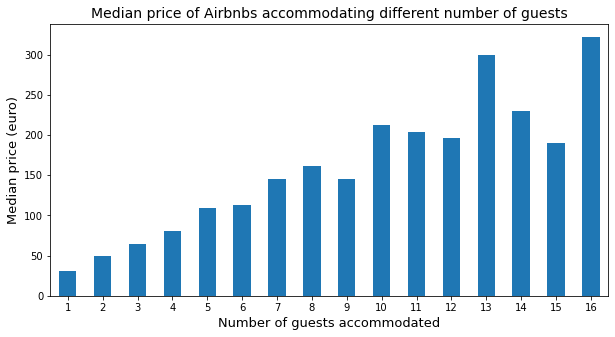

In [360]:
plt.figure(figsize=(10,5))
df_listings.groupby('accommodates').price.median().plot(kind='bar')
plt.title('Median price of Airbnbs accommodating different number of guests', fontsize=14)
plt.xlabel('Number of guests accommodated', fontsize=13)
plt.ylabel('Median price (euro)', fontsize=13)
plt.xticks(rotation=0)
plt.xlim(left=0.5)
plt.show()

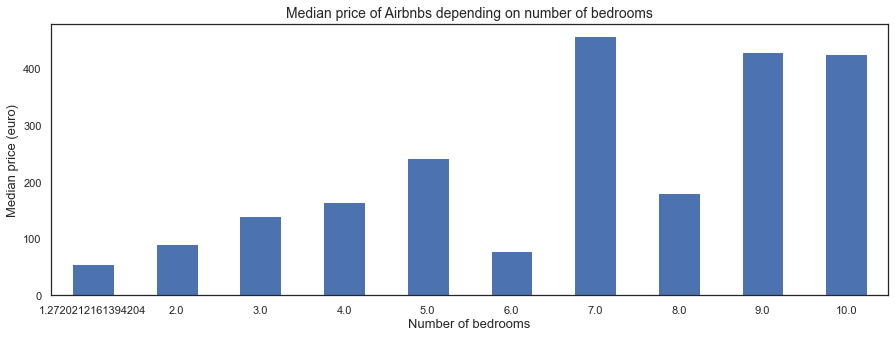

In [759]:
plt.figure(figsize=(15,5))
df_listings.groupby('bedrooms').price.median().plot(kind='bar')
plt.title('Median price of Airbnbs depending on number of bedrooms', fontsize=14)
plt.xlabel('Number of bedrooms', fontsize=13)
plt.ylabel('Median price (euro)', fontsize=13)
plt.xticks(rotation=0)
plt.xlim(left=0.5)
plt.show()

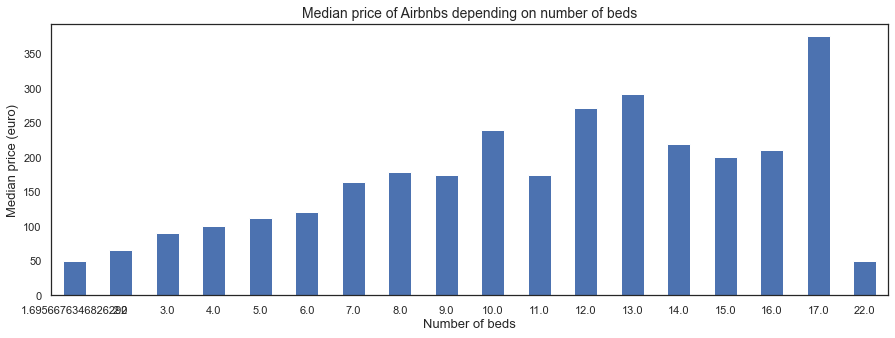

In [760]:
plt.figure(figsize=(15,5))
df_listings.groupby('beds').price.median().plot(kind='bar')
plt.title('Median price of Airbnbs depending on number of beds', fontsize=14)
plt.xlabel('Number of beds', fontsize=13)
plt.ylabel('Median price (euro)', fontsize=13)
plt.xticks(rotation=0)
plt.xlim(left=0.5)
plt.show()

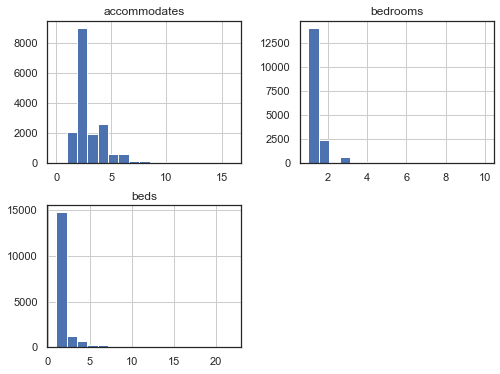

In [762]:
df_listings[['accommodates',  'bedrooms', 'beds']].hist(figsize=(8,6),bins=17);

In [362]:
def category_count_plot(col, figsize=(8,4)):
    """
    Plots a simple bar chart of the total count for each category in the column specified.
    A figure size can optionally be specified.
    """
    plt.figure(figsize=figsize)
    df_listings[col].value_counts().plot(kind='bar')
    plt.title(col)
    plt.xticks(rotation=0)
    plt.show()

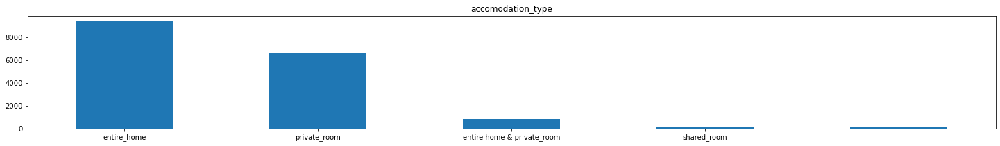


entire_home                   0.546722
private_room                  0.388075
entire home & private_room    0.050384
shared_room                   0.008775
                              0.006044
Name: accomodation_type, dtype: float64


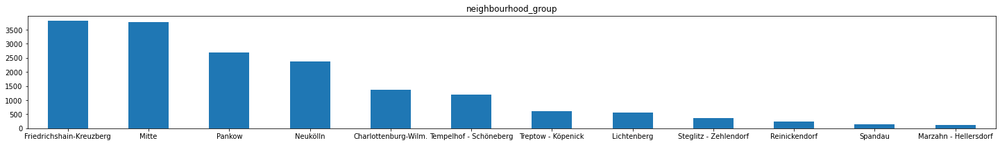


Friedrichshain-Kreuzberg    0.221351
Mitte                       0.219200
Pankow                      0.156381
Neukölln                    0.137843
Charlottenburg-Wilm.        0.079382
Tempelhof - Schöneberg      0.069038
Treptow - Köpenick          0.034693
Lichtenberg                 0.032136
Steglitz - Zehlendorf       0.021385
Reinickendorf               0.014121
Spandau                     0.007613
Marzahn - Hellersdorf       0.006857
Name: neighbourhood_group, dtype: float64


In [363]:
for col in ['accomodation_type', 'neighbourhood_group']:
    category_count_plot(  col, figsize=(25,3))
    print('')
    print(df_listings[col].value_counts(normalize=True))

### Popularity by price category and area?

In [364]:
df_listings[df_listings.price>0].price.min(), df_listings.price.max()

(8, 500)

In [365]:
fig = px.histogram(df_listings, x="price", title = 'Price distribution (euro)')
fig.show()

### Lets devide in price, score categories all listings:

In [366]:
df_listings = df_listings.set_index('id')

In [367]:
quantiles = df_listings.quantile(q=[0.25,0.5,0.75])

In [368]:
quantiles

,host_id,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,...,review_scores_accuracy,review_scores_rating,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms
0.25,1.202381e+07,52.48966,13.36858,35.0,2.0,1.0,0.03,1.0,0.0,0.0,...,4.791018,4.629097,4.62,4.824876,4.828299,4.75,4.63,0.0,0.0,0.0
0.50,4.357169e+07,52.50980,13.41478,55.0,3.0,5.0,0.15,1.0,0.0,0.0,...,4.850000,4.750000,4.67,4.880000,4.890000,4.79,4.67,1.0,0.0,0.0
0.75,1.449445e+08,52.53325,13.43916,85.0,5.0,19.0,0.63,2.0,161.0,2.0,...,5.000000,5.000000,4.96,5.000000,5.000000,5.00,4.90,1.0,1.0,0.0


In [369]:
quantiles = quantiles[['price','review_scores_rating','review_scores_location']].to_dict()


In [370]:
quantiles

{'price': {0.25: 35.0, 0.5: 55.0, 0.75: 85.0},
 'review_scores_rating': {0.25: 4.629096994730074, 0.5: 4.75, 0.75: 5.0},
 'review_scores_location': {0.25: 4.75, 0.5: 4.79, 0.75: 5.0}}

In [371]:
# Arguments (x = value, p = price,nights_booked_monthly,monthly_earnings , k = quartiles dict)
def CategoryClass(x,p,d):
    if x <= d[p][0.25]:
        return 4
    elif x <= d[p][0.50]:
        return 3
    elif x <= d[p][0.75]: 
        return 2
    else:
        return 1
    

In [372]:
categories = df_listings[['price','review_scores_rating','review_scores_location']]

In [373]:
categories.head()

,price,review_scores_rating,review_scores_location
id,,,
2015,53,4.66,4.96
3176,90,4.63,4.92
7071,33,4.83,4.91
9991,180,5.00,4.86
14325,70,4.67,4.58


In [374]:
categories['price_category'] = categories['price'].apply(CategoryClass, args=('price',quantiles,))
categories['reviews_score_category'] = categories['review_scores_rating'].apply(CategoryClass, args=('review_scores_rating',quantiles,))
categories['location_score_category'] = categories['review_scores_location'].apply(CategoryClass, args=('review_scores_location',quantiles,))


In [375]:
categories['price_reviews_location_class'] = categories.price_category.map(str) \
                            + categories.reviews_score_category.map(str) \
                            + categories.location_score_category.map(str)


In [376]:
categories.head()

,price,review_scores_rating,review_scores_location,price_category,reviews_score_category,location_score_category,price_reviews_location_class
id,,,,,,,
2015,53,4.66,4.96,3,3,2,332
3176,90,4.63,4.92,1,3,2,132
7071,33,4.83,4.91,4,2,2,422
9991,180,5.00,4.86,1,2,2,122
14325,70,4.67,4.58,2,3,4,234


In [377]:
#categories[categories.price_reviews_location_class == '132']

In [378]:
#categories.groupby('price_reviews_location_class').size()

In [379]:
fig = px.histogram(categories, x="price", color="price_category", 
                   facet_col="price_category",
                   title="Price distribution")
fig.show()

In [380]:
fig = px.histogram(categories, x="review_scores_rating", color="reviews_score_category", 
                   facet_col="reviews_score_category",
                   title="Reviews_score distribution")
fig.show()

In [381]:
fig = px.histogram(categories, x="review_scores_location", color="location_score_category", 
                   facet_col="location_score_category",
                   title="Location score distribution")
fig.show()

In [382]:
df_listings.sample(3)

,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,...,review_scores_rating,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,accomodation_type
id,,,,,,,,,,,,,,,,,,,,,
31826398,Cozy room with 2 sweet cats! (NO vaccine requi...,46692555,Max,Friedrichshain-Kreuzberg,Frankfurter Allee Süd FK,52.50119,13.46485,Private room,30,3,...,4.79,4.75,4.97,4.9,4.9,4.84,1,1,0,entire home & private_room
40363358,gemütliche Wohnung im Herzen von Berlin,311991384,Carla,Tempelhof - Schöneberg,Schöneberg-Süd,52.48759,13.34963,Entire home/apt,28,1,...,5.00,5.00,5.00,5.0,5.0,5.00,1,0,0,entire_home
51241323,Central Flat in popular Prenzlauer Berg,382862768,Nele,Pankow,Prenzlauer Berg Südwest,52.53840,13.40592,Entire home/apt,85,6,...,5.00,4.00,4.50,5.0,5.0,4.50,2,0,0,entire_home


In [383]:
df_listings.columns

Index(['name', 'host_id', 'host_name', 'neighbourhood_group', 'neighbourhood',
       'latitude', 'longitude', 'room_type', 'price', 'minimum_nights',
       'number_of_reviews', 'reviews_per_month',
       'calculated_host_listings_count', 'availability_365',
       'number_of_reviews_ltm', 'license', 'property_type', 'description',
       'neighborhood_overview', 'accommodates', 'bedrooms', 'beds',
       'has_availability', 'maximum_nights', 'availability_30',
       'availability_60', 'availability_90', 'review_scores_accuracy',
       'review_scores_rating', 'review_scores_cleanliness',
       'review_scores_checkin', 'review_scores_communication',
       'review_scores_location', 'review_scores_value',
       'calculated_host_listings_count_entire_homes',
       'calculated_host_listings_count_private_rooms',
       'calculated_host_listings_count_shared_rooms', 'accomodation_type'],
      dtype='object')

In [384]:
df_listings.isnull().sum()

name                                            0
host_id                                         0
host_name                                       0
neighbourhood_group                             0
neighbourhood                                   0
latitude                                        0
longitude                                       0
room_type                                       0
price                                           0
minimum_nights                                  0
number_of_reviews                               0
reviews_per_month                               0
calculated_host_listings_count                  0
availability_365                                0
number_of_reviews_ltm                           0
license                                         0
property_type                                   0
description                                     0
neighborhood_overview                           0
accommodates                                    0


In [385]:
#df_listings = df_listings.dropna(axis=1)

In [386]:
columns_drop = ['calculated_host_listings_count_entire_homes','calculated_host_listings_count_private_rooms','calculated_host_listings_count_shared_rooms']
df_listings = df_listings.drop(columns_drop,axis=1)


<a id='question2'></a>
## Business question 2. What Characteristics (Features) impact the price of Airnbnb listing in Berlin the most??

[back to start](#start)

In [387]:
#sns.pairplot(df_listings);

<a id='model1'></a>

##  LinearRegression model:

In [451]:
df_listings_ml = df_listings.copy()

In [389]:
# X = df_listings_ml[['latitude', 'longitude','minimum_nights','maximum_nights','accommodates','bedrooms','beds','number_of_reviews','availability_30',
#        'availability_60', 'availability_90','availability_365','reviews_per_month','review_scores_rating',
#        'review_scores_location']]

# X.head()


In [390]:
X = df_listings_ml[['latitude', 'longitude','accommodates','bedrooms','beds','number_of_reviews','availability_30',
        'availability_90','availability_365','review_scores_rating',
       'review_scores_location']]
y = df_listings_ml['price']


In [391]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

In [452]:
X_train , X_test, y_train, y_test = train_test_split(X,y,test_size=0.15,random_state=5)

In [453]:
model = LinearRegression()

In [454]:
model.fit(X_train,y_train)

LinearRegression()

In [455]:
predicted_prices = model.predict(X_train)
predicted_prices


array([145.45661697,  34.89889578,  67.92557631, ...,  60.14998739,
       124.27589401,  98.44420472])

In [456]:
validation_prices = model.predict(X_test)
validation_prices

array([ 83.04639809,  61.35010626,  81.04434581, ..., 124.57351843,
        69.8668716 ,  66.89664931])

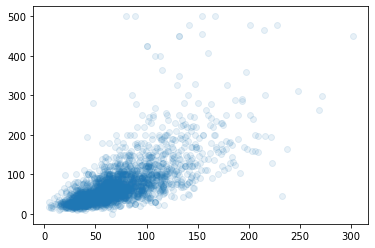

In [457]:
plt.scatter(validation_prices,y_test, alpha = 0.1) ;

In [458]:
#plt.scatter(validation_prices,y_test, alpha = 0.5,c=['red','green']) ;

In [459]:
r2_score(y_test,validation_prices) #  moving at the same direction # kinda %-accuracy

0.46594267736850725

In [460]:
model.coef_ 

array([-1.30680960e+02, -1.56442047e+01,  1.08589048e+01,  1.99713162e+01,
       -2.68836155e+00, -8.33860929e-02,  7.14844529e-01,  1.54410453e-01,
        1.11033706e-02,  2.47631180e+00,  7.48678261e+00,  3.75020071e+01,
       -8.34396562e+00,  4.26085564e+00, -1.58398212e+01, -1.75790759e+01,
        3.70542512e+00,  6.29119537e+00, -8.03201175e-01, -4.34835746e+00,
        1.37002187e+01, -4.48627109e+00,  1.29799829e+01, -4.28406569e+00,
        2.80523877e+00, -1.17202448e+01, -3.56805055e+00, -1.02718700e+01,
       -4.99976128e+00,  4.99976128e+00])

In [461]:
#FEATURE IMPORTANCE
df_model = pd.DataFrame(model.coef_,X.columns )
df_model

,0
latitude,-130.680960
longitude,-15.644205
accommodates,10.858905
bedrooms,19.971316
beds,-2.688362
number_of_reviews,-0.083386
availability_30,0.714845
availability_90,0.154410
availability_365,0.011103
review_scores_rating,2.476312


In [462]:
df_model = df_model.sort_values(0,ascending=False)
df_model

,0
accomodation_type_,37.502007
bedrooms,19.971316
neighbourhood_group_Mitte,13.700219
neighbourhood_group_Pankow,12.979983
accommodates,10.858905
review_scores_location,7.486783
neighbourhood_group_Friedrichshain-Kreuzberg,6.291195
license_yes,4.999761
accomodation_type_entire_home,4.260856
neighbourhood_group_Charlottenburg-Wilm.,3.705425


- with one unit increase in feature number of Bedrooms, target price will increase by 22 $, while keeping everything else constant

In [463]:
# Check the predictions against the actual values by using the MSE and R-2 metrics:
print("\nTraining RMSE:", round(mean_squared_error(y_train,  predicted_prices),4))
print("Validation RMSE:", round(mean_squared_error(y_test, validation_prices),4))
print("\nTraining r2:", round(r2_score(y_train, predicted_prices),4))
print("Validation r2:", round(r2_score(y_test, validation_prices),4))


Training RMSE: 1614.481
Validation RMSE: 1779.8313

Training r2: 0.44
Validation r2: 0.4659


So the features explain approximately 46,59% (random_state = 5 )of the variance in the target variable. Interpreting the mean_squared_errorvalue is somewhat more intuitive that the r-squared value. As the square root of a variance, RMSE can be interpreted as the standard deviation of the unexplained variance, and has the useful property of being in the same units as the response variable. Lower values of RMSE indicate better fit. RMSE is a good measure of how accurately the model predicts the response. We can see this relationship graphically with a scatter plot.

### lets add categorical values:

In [474]:
df_listings_ml = df_listings.copy()

In [475]:

X = df_listings_ml[['latitude', 'longitude','accommodates','bedrooms','beds','number_of_reviews','availability_30',
        'availability_90','availability_365','review_scores_rating',
       'review_scores_location','accomodation_type','neighbourhood_group','license']]

X.head()

,latitude,longitude,accommodates,bedrooms,beds,number_of_reviews,availability_30,availability_90,availability_365,review_scores_rating,review_scores_location,accomodation_type,neighbourhood_group,license
id,,,,,,,,,,,,,,
2015,52.53305,13.40394,2,1.000000,2.0,144,28,64,326,4.66,4.96,entire_home,Mitte,no
3176,52.53471,13.41810,4,1.000000,2.0,147,0,0,170,4.63,4.92,entire_home,Pankow,no
7071,52.54301,13.41534,2,1.000000,2.0,293,0,0,0,4.83,4.91,private_room,Pankow,no
9991,52.53269,13.41805,7,4.000000,7.0,8,0,0,0,5.00,4.86,entire_home,Pankow,yes
14325,52.54813,13.40366,1,1.272021,1.0,26,19,19,159,4.67,4.58,entire_home,Pankow,no


In [476]:
X = pd.get_dummies(X)
X.head()

,latitude,longitude,accommodates,bedrooms,beds,number_of_reviews,availability_30,availability_90,availability_365,review_scores_rating,...,neighbourhood_group_Mitte,neighbourhood_group_Neukölln,neighbourhood_group_Pankow,neighbourhood_group_Reinickendorf,neighbourhood_group_Spandau,neighbourhood_group_Steglitz - Zehlendorf,neighbourhood_group_Tempelhof - Schöneberg,neighbourhood_group_Treptow - Köpenick,license_no,license_yes
id,,,,,,,,,,,,,,,,,,,,,
2015,52.53305,13.40394,2,1.000000,2.0,144,28,64,326,4.66,...,1,0,0,0,0,0,0,0,1,0
3176,52.53471,13.41810,4,1.000000,2.0,147,0,0,170,4.63,...,0,0,1,0,0,0,0,0,1,0
7071,52.54301,13.41534,2,1.000000,2.0,293,0,0,0,4.83,...,0,0,1,0,0,0,0,0,1,0
9991,52.53269,13.41805,7,4.000000,7.0,8,0,0,0,5.00,...,0,0,1,0,0,0,0,0,0,1
14325,52.54813,13.40366,1,1.272021,1.0,26,19,19,159,4.67,...,0,0,1,0,0,0,0,0,1,0


In [477]:
X_train , X_test, y_train, y_test = train_test_split(X,y,test_size=0.15,random_state=5)
model = LinearRegression()
model.fit(X_train,y_train)

LinearRegression()

In [478]:
predicted_prices = model.predict(X_train)
predicted_prices

array([145.45661697,  34.89889578,  67.92557631, ...,  60.14998739,
       124.27589401,  98.44420472])

In [479]:
validation_prices = model.predict(X_test)
validation_prices

array([ 83.04639809,  61.35010626,  81.04434581, ..., 124.57351843,
        69.8668716 ,  66.89664931])

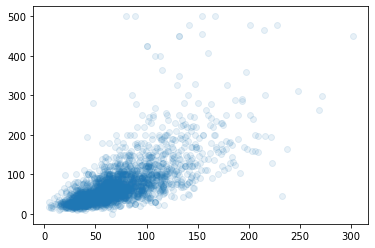

In [480]:
plt.scatter(validation_prices,y_test, alpha = 0.1) ;

In [481]:
r2_score(y_test,validation_prices) #  moving at the same direction # kinda %-accuracy

0.46594267736850725

In [482]:
#FEATURE IMPORTANCE
df_model = pd.DataFrame(model.coef_,X.columns )
df_model = df_model.sort_values(0,ascending=False)
df_model[:30]

,0
accomodation_type_,37.502007
bedrooms,19.971316
neighbourhood_group_Mitte,13.700219
neighbourhood_group_Pankow,12.979983
accommodates,10.858905
review_scores_location,7.486783
neighbourhood_group_Friedrichshain-Kreuzberg,6.291195
license_yes,4.999761
accomodation_type_entire_home,4.260856
neighbourhood_group_Charlottenburg-Wilm.,3.705425


In [483]:
# Check the predictions against the actual values by using the MSE and R-2 metrics:
print("\nTraining RMSE:", round(mean_squared_error(y_train,  predicted_prices),4))
print("Validation RMSE:", round(mean_squared_error(y_test, validation_prices),4))
print("\nTraining r2:", round(r2_score(y_train, predicted_prices),4))
print("Validation r2:", round(r2_score(y_test, validation_prices),4))


Training RMSE: 1614.481
Validation RMSE: 1779.8313

Training r2: 0.44
Validation r2: 0.4659


## Lets check multi-collinearity

In [484]:
def multi_collinearity_heatmap(df, figsize=(11,9)):
    
    """
    Creates a heatmap of correlations between features in the df. A figure size can optionally be set.
    """
    
    # Set the style of the visualization
    sns.set(style="white")

    # Create a covariance matrix
    corr = df.corr()

    # Generate a mask the size of our covariance matrix
    mask = np.zeros_like(corr, dtype=np.bool)
    mask[np.triu_indices_from(mask)] = True

    # Set up the matplotlib figure
    f, ax = plt.subplots(figsize=figsize)

    # Generate a custom diverging colormap
    cmap = sns.diverging_palette(220, 10, as_cmap=True)

    # Draw the heatmap with the mask and correct aspect ratio
    sns.heatmap(corr, mask=mask, cmap=cmap, center=0, square=True, linewidths=.5, cbar_kws={"shrink": .5}, vmax=corr[corr != 1.0].max().max());


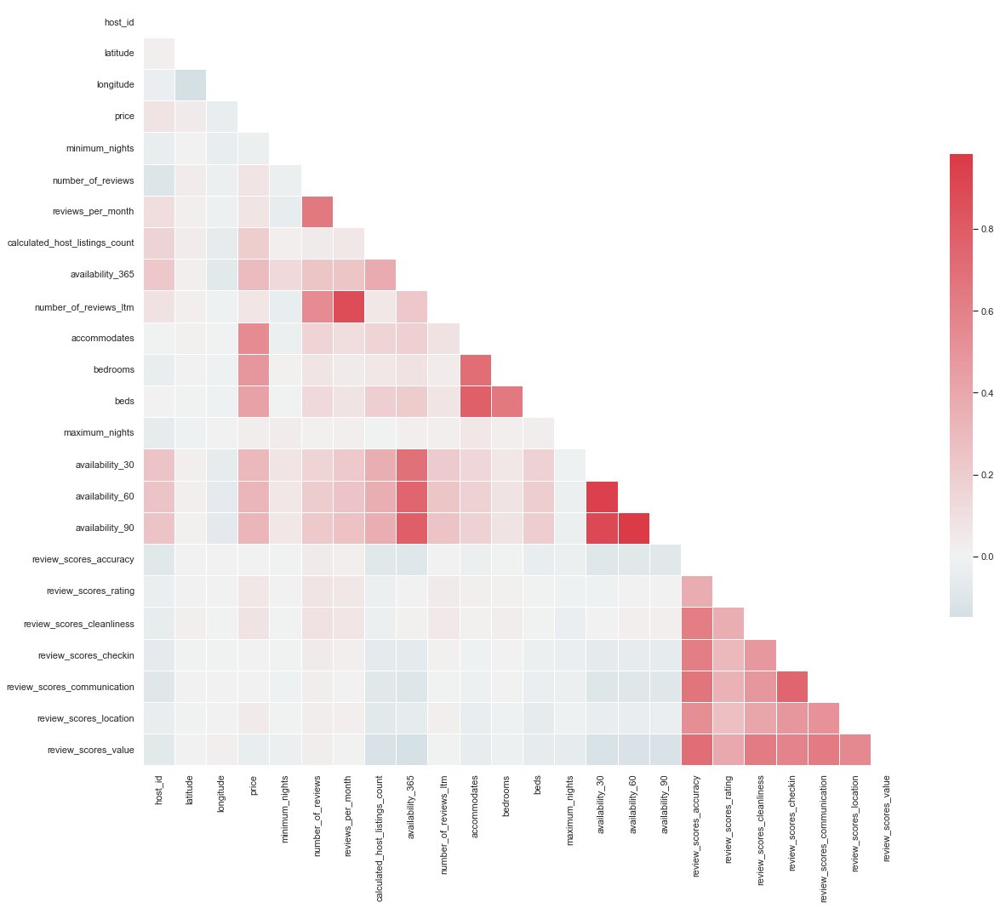

In [485]:
multi_collinearity_heatmap(df_listings_ml, figsize=(20,20))

In [486]:
df_listings_ml = df_listings.copy()

In [487]:
X = df_listings_ml[['latitude', 'longitude','accommodates','bedrooms','number_of_reviews','availability_30',
        'availability_365','review_scores_rating',
       'review_scores_location','accomodation_type','neighbourhood_group','license']]

X.head()

,latitude,longitude,accommodates,bedrooms,number_of_reviews,availability_30,availability_365,review_scores_rating,review_scores_location,accomodation_type,neighbourhood_group,license
id,,,,,,,,,,,,
2015,52.53305,13.40394,2,1.000000,144,28,326,4.66,4.96,entire_home,Mitte,no
3176,52.53471,13.41810,4,1.000000,147,0,170,4.63,4.92,entire_home,Pankow,no
7071,52.54301,13.41534,2,1.000000,293,0,0,4.83,4.91,private_room,Pankow,no
9991,52.53269,13.41805,7,4.000000,8,0,0,5.00,4.86,entire_home,Pankow,yes
14325,52.54813,13.40366,1,1.272021,26,19,159,4.67,4.58,entire_home,Pankow,no


In [489]:
X = pd.get_dummies(X)
X_train , X_test, y_train, y_test = train_test_split(X,y,test_size=0.15,random_state=5)
model = LinearRegression()
model.fit(X_train,y_train)
predicted_prices = model.predict(X_train)
validation_prices = model.predict(X_test)

In [490]:
r2_score(y_test,validation_prices) #  moving at the same direction # kinda %-accuracy

0.4638771603795627

=> it decrese accuracy of prediction

In [491]:
#FEATURE IMPORTANCE
df_model = pd.DataFrame(model.coef_,X.columns )
df_model = df_model.sort_values(0,ascending=False)
df_model[:30]

,0
accomodation_type_,37.318546
bedrooms,18.929006
neighbourhood_group_Mitte,14.026259
neighbourhood_group_Pankow,13.295644
accommodates,9.594064
review_scores_location,7.717542
neighbourhood_group_Friedrichshain-Kreuzberg,6.511719
license_yes,5.130660
accomodation_type_entire_home,4.617932
neighbourhood_group_Charlottenburg-Wilm.,3.880099


In [492]:
# Check the predictions against the actual values by using the MSE and R-2 metrics:
print("\nTraining RMSE:", round(mean_squared_error(y_train,  predicted_prices),4))
print("Validation RMSE:", round(mean_squared_error(y_test, validation_prices),4))
print("\nTraining r2:", round(r2_score(y_train, predicted_prices),4))
print("Validation r2:", round(r2_score(y_test, validation_prices),4))


Training RMSE: 1621.7503
Validation RMSE: 1786.715

Training r2: 0.4375
Validation r2: 0.4639


### => removing correlated features didnt helped improve accuracy

### Lets add more Features with reviews:

In [493]:
df_listings_ml = df_listings.copy()

In [494]:
df_listings_ml.columns

Index(['name', 'host_id', 'host_name', 'neighbourhood_group', 'neighbourhood',
       'latitude', 'longitude', 'room_type', 'price', 'minimum_nights',
       'number_of_reviews', 'reviews_per_month',
       'calculated_host_listings_count', 'availability_365',
       'number_of_reviews_ltm', 'license', 'property_type', 'description',
       'neighborhood_overview', 'accommodates', 'bedrooms', 'beds',
       'has_availability', 'maximum_nights', 'availability_30',
       'availability_60', 'availability_90', 'review_scores_accuracy',
       'review_scores_rating', 'review_scores_cleanliness',
       'review_scores_checkin', 'review_scores_communication',
       'review_scores_location', 'review_scores_value', 'accomodation_type'],
      dtype='object')

In [495]:
X = df_listings_ml[['latitude', 'longitude','accommodates','bedrooms','beds','number_of_reviews','availability_30',
        'availability_90','availability_365','review_scores_accuracy',
       'review_scores_accuracy',
       'review_scores_rating', 'review_scores_cleanliness',
       'review_scores_checkin', 'review_scores_communication',
       'review_scores_location', 'review_scores_value', 'accomodation_type','neighbourhood_group','license']]

X.head()

,latitude,longitude,accommodates,bedrooms,beds,number_of_reviews,availability_30,availability_90,availability_365,review_scores_accuracy,review_scores_accuracy,review_scores_rating,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,accomodation_type,neighbourhood_group,license
id,,,,,,,,,,,,,,,,,,,,
2015,52.53305,13.40394,2,1.000000,2.0,144,28,64,326,4.79,4.79,4.66,4.52,4.88,4.90,4.96,4.58,entire_home,Mitte,no
3176,52.53471,13.41810,4,1.000000,2.0,147,0,0,170,4.68,4.68,4.63,4.53,4.64,4.69,4.92,4.63,entire_home,Pankow,no
7071,52.54301,13.41534,2,1.000000,2.0,293,0,0,0,4.85,4.85,4.83,4.90,4.86,4.85,4.91,4.71,private_room,Pankow,no
9991,52.53269,13.41805,7,4.000000,7.0,8,0,0,0,5.00,5.00,5.00,5.00,5.00,5.00,4.86,4.86,entire_home,Pankow,yes
14325,52.54813,13.40366,1,1.272021,1.0,26,19,19,159,5.00,5.00,4.67,4.84,4.68,4.84,4.58,4.42,entire_home,Pankow,no


In [496]:
X = pd.get_dummies(X)
X.head()

,latitude,longitude,accommodates,bedrooms,beds,number_of_reviews,availability_30,availability_90,availability_365,review_scores_accuracy,...,neighbourhood_group_Mitte,neighbourhood_group_Neukölln,neighbourhood_group_Pankow,neighbourhood_group_Reinickendorf,neighbourhood_group_Spandau,neighbourhood_group_Steglitz - Zehlendorf,neighbourhood_group_Tempelhof - Schöneberg,neighbourhood_group_Treptow - Köpenick,license_no,license_yes
id,,,,,,,,,,,,,,,,,,,,,
2015,52.53305,13.40394,2,1.000000,2.0,144,28,64,326,4.79,...,1,0,0,0,0,0,0,0,1,0
3176,52.53471,13.41810,4,1.000000,2.0,147,0,0,170,4.68,...,0,0,1,0,0,0,0,0,1,0
7071,52.54301,13.41534,2,1.000000,2.0,293,0,0,0,4.85,...,0,0,1,0,0,0,0,0,1,0
9991,52.53269,13.41805,7,4.000000,7.0,8,0,0,0,5.00,...,0,0,1,0,0,0,0,0,0,1
14325,52.54813,13.40366,1,1.272021,1.0,26,19,19,159,5.00,...,0,0,1,0,0,0,0,0,1,0


In [497]:
X_train , X_test, y_train, y_test = train_test_split(X,y,test_size=0.15,random_state=5)
model = LinearRegression()
model.fit(X_train,y_train)

LinearRegression()

In [498]:
predicted_prices = model.predict(X_train)
validation_prices = model.predict(X_test)
predicted_prices

array([147.2310822 ,  37.18488569,  65.75578036, ...,  59.30623847,
       124.28506064,  96.70009153])

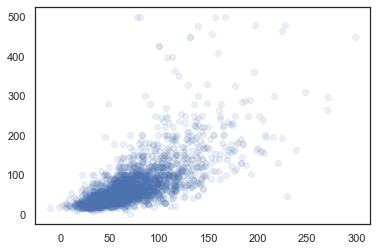

In [499]:
plt.scatter(validation_prices,y_test, alpha = 0.1) ;

In [500]:
r2_score(y_test,validation_prices) #  moving at the same direction # kinda %-accuracy

0.4681883040960908

In [501]:
# Check the predictions against the actual values by using the MSE and R-2 metrics:
print("\nTraining RMSE:", round(mean_squared_error(y_train,  predicted_prices),4))
print("Validation RMSE:", round(mean_squared_error(y_test, validation_prices),4))
print("\nTraining r2:", round(r2_score(y_train, predicted_prices),4))
print("Validation r2:", round(r2_score(y_test, validation_prices),4))


Training RMSE: 1602.7158
Validation RMSE: 1772.3474

Training r2: 0.4441
Validation r2: 0.4682


In [502]:
# Check the predictions against the actual values by using the MSE and R-2 metrics:
print("\nTraining RMSE:", round(mean_squared_error(y_train,  predicted_prices),4))
print("Validation RMSE:", round(mean_squared_error(y_test, validation_prices),4))
print("\nTraining r2:", round(r2_score(y_train, predicted_prices),4))
print("Validation r2:", round(r2_score(y_test, validation_prices),4))


Training RMSE: 1602.7158
Validation RMSE: 1772.3474

Training r2: 0.4441
Validation r2: 0.4682


### => by Adding additional categorical Features we slightly increased accuracy of prediction, but not much

<a id='model2'></a>

## OLS model:

[back to start](#start)

In [503]:
import statsmodels.formula.api as smf

In [504]:

import statsmodels.api as sm 

In [505]:
df_listings_ml.isnull().sum()

name                              0
host_id                           0
host_name                         0
neighbourhood_group               0
neighbourhood                     0
latitude                          0
longitude                         0
room_type                         0
price                             0
minimum_nights                    0
number_of_reviews                 0
reviews_per_month                 0
calculated_host_listings_count    0
availability_365                  0
number_of_reviews_ltm             0
license                           0
property_type                     0
description                       0
neighborhood_overview             0
accommodates                      0
bedrooms                          0
beds                              0
has_availability                  0
maximum_nights                    0
availability_30                   0
availability_60                   0
availability_90                   0
review_scores_accuracy      

In [506]:
X = df_listings_ml[['latitude', 'longitude','accommodates','bedrooms','beds','number_of_reviews','availability_30','accommodates',
                  'bedrooms', 'beds',  'availability_90','availability_365','review_scores_accuracy',
       'review_scores_rating', 'review_scores_cleanliness',
       'review_scores_checkin', 'review_scores_communication',
       'review_scores_location','minimum_nights']]
y = df_listings_ml['price']


In [507]:
model_ols = sm.OLS(y,X)
model_ols = model_ols.fit()

In [508]:
model_ols.summary() 

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:                  price   R-squared (uncentered):                   0.774
Model:                            OLS   Adj. R-squared (uncentered):              0.774
Method:                 Least Squares   F-statistic:                              3676.
Date:                Tue, 21 Jun 2022   Prob (F-statistic):                        0.00
Time:                        19:59:12   Log-Likelihood:                         -88776.
No. Observations:               17208   AIC:                                  1.776e+05
Df Residuals:                   17192   BIC:                                  1.777e+05
Df Model:                          16                                                  
Covariance Type:            nonrobust                                                  
===============================================================================================
                                  coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------
latitude                        4.8830      1.276      3.827      0.000       2.382       7.384
longitude                     -23.1625      4.981     -4.651      0.000     -32.925     -13.400
accommodates                    6.8001      0.178     38.116      0.000       6.450       7.150
bedrooms                       11.3500      0.397     28.587      0.000      10.572      12.128
beds                           -1.8808      0.217     -8.678      0.000      -2.306      -1.456
number_of_reviews              -0.0694      0.006    -11.004      0.000      -0.082      -0.057
availability_30                 0.7645      0.080      9.594      0.000       0.608       0.921
accommodates                    6.8001      0.178     38.116      0.000       6.450       7.150
bedrooms                       11.3500      0.397     28.587      0.000      10.572      12.128
beds                           -1.8808      0.217     -8.678      0.000      -2.306      -1.456
availability_90                 0.1408      0.027      5.239      0.000       0.088       0.194
availability_365                0.0328      0.004      7.952      0.000       0.025       0.041
review_scores_accuracy         -4.3175      1.381     -3.127      0.002      -7.024      -1.611
review_scores_rating            2.4773      0.497      4.988      0.000       1.504       3.451
review_scores_cleanliness       7.2167      0.910      7.933      0.000       5.434       9.000
review_scores_checkin          -3.8803      1.491     -2.602      0.009      -6.803      -0.957
review_scores_communication     0.2697      1.555      0.173      0.862      -2.778       3.318
review_scores_location         10.5321      1.174      8.971      0.000       8.231      12.833
minimum_nights                 -0.0691      0.009     -7.732      0.000      -0.087      -0.052
==============================================================================
Omnibus:                    11873.959   Durbin-Watson:                   1.774
Prob(Omnibus):                  0.000   Jarque-Bera (JB):           312351.185
Skew:                           2.970   Prob(JB):                         0.00
Kurtosis:                      23.009   Cond. No.                     6.58e+18
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The smallest eigenvalue is 1.06e-29. This might indicate that there are
strong multicollinearity problems or that the design matrix is singular.
"""

**R-squared** - you add more features you will get better R-squared, although you can add feature which will impact in a negative way, it might get improve a little bit but not get worse

**adj. R-squared** - will go down if adding new feature will not contributing to your model prediction and it not worth of adding that feature. It will say if adding that feature will significantly improve model

**coef.** - exp. if you increase education by 26 units, it will drive my prediction by 1 unit(birth_weight).

**P-value** - exp. 36% chance that monpre variable has no effect on the dependent variable which is birth-weight

the lower the value - the better prediction is
We need to run a loop to remove less significnt features one by one:

remove one feature => run prediction model => it might re-adjust p-values for other features, and they might be significnt this time => you will stop.
and then remove other feature and check that again....

#### Removing not significant feature(reviews per month) and reruning the model:

In [509]:
X = df_listings_ml[['latitude', 'longitude','accommodates','bedrooms','beds','number_of_reviews','availability_30','accommodates',
                  'bedrooms', 'beds',  'availability_90','availability_365','review_scores_accuracy',
       'review_scores_rating', 'review_scores_cleanliness',
       'review_scores_checkin', 
       'review_scores_location','minimum_nights']]
y = df_listings_ml['price']


In [510]:
model_ols = sm.OLS(y,X)
model_ols = model_ols.fit()

In [511]:
model_ols.summary() 

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:                  price   R-squared (uncentered):                   0.774
Model:                            OLS   Adj. R-squared (uncentered):              0.774
Method:                 Least Squares   F-statistic:                              3922.
Date:                Tue, 21 Jun 2022   Prob (F-statistic):                        0.00
Time:                        19:59:38   Log-Likelihood:                         -88776.
No. Observations:               17208   AIC:                                  1.776e+05
Df Residuals:                   17193   BIC:                                  1.777e+05
Df Model:                          15                                                  
Covariance Type:            nonrobust                                                  
=============================================================================================
                                coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------
latitude                      4.8852      1.276      3.829      0.000       2.384       7.386
longitude                   -23.1615      4.980     -4.651      0.000     -32.924     -13.399
accommodates                  6.8001      0.178     38.117      0.000       6.450       7.150
bedrooms                     11.3502      0.397     28.589      0.000      10.572      12.128
beds                         -1.8805      0.217     -8.677      0.000      -2.305      -1.456
number_of_reviews            -0.0694      0.006    -11.005      0.000      -0.082      -0.057
availability_30               0.7644      0.080      9.593      0.000       0.608       0.921
accommodates                  6.8001      0.178     38.117      0.000       6.450       7.150
bedrooms                     11.3502      0.397     28.589      0.000      10.572      12.128
beds                         -1.8805      0.217     -8.677      0.000      -2.305      -1.456
availability_90               0.1408      0.027      5.238      0.000       0.088       0.193
availability_365              0.0328      0.004      7.951      0.000       0.025       0.041
review_scores_accuracy       -4.2508      1.326     -3.205      0.001      -6.850      -1.651
review_scores_rating          2.4841      0.495      5.017      0.000       1.514       3.455
review_scores_cleanliness     7.2221      0.909      7.944      0.000       5.440       9.004
review_scores_checkin        -3.7421      1.261     -2.968      0.003      -6.213      -1.271
review_scores_location       10.5604      1.163      9.083      0.000       8.281      12.839
minimum_nights               -0.0692      0.009     -7.734      0.000      -0.087      -0.052
==============================================================================
Omnibus:                    11874.590   Durbin-Watson:                   1.774
Prob(Omnibus):                  0.000   Jarque-Bera (JB):           312418.061
Skew:                           2.970   Prob(JB):                         0.00
Kurtosis:                      23.011   Cond. No.                     3.78e+18
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The smallest eigenvalue is 3.21e-29. This might indicate that there are
strong multicollinearity problems or that the design matrix is singular.
"""

### Lets add more important for price prediction categorical features and encode them:

In [512]:
df_listings_ols = df_listings.copy()

In [513]:
# #encoding # because any ML algorithm wont understand words, everything should be converted to integers or floats
# k =1
# acoomodation_type_dict = {}
# for i in df_listings_ols.accomodation_type.unique():
#     acoomodation_type_dict[i] = k
#     k +=1
# acoomodation_type_dict  

In [514]:
# k =1
# neighbourhood_group_dict = {}
# for i in df_listings_ols.neighbourhood_group.unique():
#     neighbourhood_group_dict[i] = k
#     k +=1
# neighbourhood_group_dict  

In [515]:
# k =1
# neighbourhood_dict = {}
# for i in df_listings_ols.neighbourhood.unique():
#     neighbourhood_dict[i] = k
#     k +=1
# neighbourhood_dict  

In [516]:
# k =1
# license_dict = {}
# for i in df_listings_ols.license.unique():
#     license_dict[i] = k
#     k +=1
# license_dict  

In [517]:
#{ i:j for j,i in enumerate(df_listings.accomodation_type.unique()) } 

In [518]:
# # will map keys on values
# df_listings_ols['accomodation_type_int'] = df_listings_ols['accomodation_type'].map(acoomodation_type_dict) 
# df_listings_ols['neighbourhood_group_int'] = df_listings_ols['neighbourhood_group'].map(neighbourhood_group_dict) 
# df_listings_ols['neighbourhood_int'] = df_listings_ols['neighbourhood'].map(neighbourhood_dict)
# df_listings_ols['license_int'] = df_listings_ols['license'].map(license_dict)

In [519]:
# df_listings_ols = df_listings_ols.drop(['accomodation_type','neighbourhood','neighbourhood_group','license'],axis =1)

In [520]:
# df_listings_ols.columns

In [521]:
# X = df_listings_ols[['latitude', 'longitude','minimum_nights','bedrooms','beds','number_of_reviews','availability_30',
#        'availability_60', 'availability_90','availability_365','review_scores_rating',
#        'review_scores_location','accomodation_type_int', 'neighbourhood_group_int', 'neighbourhood_int',
#        'license_int']]


In [522]:
X = pd.get_dummies(X)
X.head()

,latitude,longitude,accommodates,bedrooms,beds,number_of_reviews,availability_30,accommodates,bedrooms,beds,availability_90,availability_365,review_scores_accuracy,review_scores_rating,review_scores_cleanliness,review_scores_checkin,review_scores_location,minimum_nights
id,,,,,,,,,,,,,,,,,,
2015,52.53305,13.40394,2,1.000000,2.0,144,28,2,1.000000,2.0,64,326,4.79,4.66,4.52,4.88,4.96,90
3176,52.53471,13.41810,4,1.000000,2.0,147,0,4,1.000000,2.0,0,170,4.68,4.63,4.53,4.64,4.92,92
7071,52.54301,13.41534,2,1.000000,2.0,293,0,2,1.000000,2.0,0,0,4.85,4.83,4.90,4.86,4.91,1
9991,52.53269,13.41805,7,4.000000,7.0,8,0,7,4.000000,7.0,0,0,5.00,5.00,5.00,5.00,4.86,6
14325,52.54813,13.40366,1,1.272021,1.0,26,19,1,1.272021,1.0,19,159,5.00,4.67,4.84,4.68,4.58,95


In [523]:
X.head(2)

,latitude,longitude,accommodates,bedrooms,beds,number_of_reviews,availability_30,accommodates,bedrooms,beds,availability_90,availability_365,review_scores_accuracy,review_scores_rating,review_scores_cleanliness,review_scores_checkin,review_scores_location,minimum_nights
id,,,,,,,,,,,,,,,,,,
2015,52.53305,13.40394,2,1.0,2.0,144,28,2,1.0,2.0,64,326,4.79,4.66,4.52,4.88,4.96,90
3176,52.53471,13.41810,4,1.0,2.0,147,0,4,1.0,2.0,0,170,4.68,4.63,4.53,4.64,4.92,92


In [524]:
y = df_listings_ols['price']

In [525]:
X_train , X_test, y_train, y_test = train_test_split(X,y,test_size=0.15)

In [526]:
model_ols = sm.OLS(y,X)
model_ols = model_ols.fit()

In [527]:
model_ols.summary() 

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:                  price   R-squared (uncentered):                   0.774
Model:                            OLS   Adj. R-squared (uncentered):              0.774
Method:                 Least Squares   F-statistic:                              3922.
Date:                Tue, 21 Jun 2022   Prob (F-statistic):                        0.00
Time:                        19:59:52   Log-Likelihood:                         -88776.
No. Observations:               17208   AIC:                                  1.776e+05
Df Residuals:                   17193   BIC:                                  1.777e+05
Df Model:                          15                                                  
Covariance Type:            nonrobust                                                  
=============================================================================================
                                coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------
latitude                      4.8852      1.276      3.829      0.000       2.384       7.386
longitude                   -23.1615      4.980     -4.651      0.000     -32.924     -13.399
accommodates                  6.8001      0.178     38.117      0.000       6.450       7.150
bedrooms                     11.3502      0.397     28.589      0.000      10.572      12.128
beds                         -1.8805      0.217     -8.677      0.000      -2.305      -1.456
number_of_reviews            -0.0694      0.006    -11.005      0.000      -0.082      -0.057
availability_30               0.7644      0.080      9.593      0.000       0.608       0.921
accommodates                  6.8001      0.178     38.117      0.000       6.450       7.150
bedrooms                     11.3502      0.397     28.589      0.000      10.572      12.128
beds                         -1.8805      0.217     -8.677      0.000      -2.305      -1.456
availability_90               0.1408      0.027      5.238      0.000       0.088       0.193
availability_365              0.0328      0.004      7.951      0.000       0.025       0.041
review_scores_accuracy       -4.2508      1.326     -3.205      0.001      -6.850      -1.651
review_scores_rating          2.4841      0.495      5.017      0.000       1.514       3.455
review_scores_cleanliness     7.2221      0.909      7.944      0.000       5.440       9.004
review_scores_checkin        -3.7421      1.261     -2.968      0.003      -6.213      -1.271
review_scores_location       10.5604      1.163      9.083      0.000       8.281      12.839
minimum_nights               -0.0692      0.009     -7.734      0.000      -0.087      -0.052
==============================================================================
Omnibus:                    11874.590   Durbin-Watson:                   1.774
Prob(Omnibus):                  0.000   Jarque-Bera (JB):           312418.061
Skew:                           2.970   Prob(JB):                         0.00
Kurtosis:                      23.011   Cond. No.                     3.78e+18
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The smallest eigenvalue is 3.21e-29. This might indicate that there are
strong multicollinearity problems or that the design matrix is singular.
"""

### => by adding additional categorical features R2 increased

In [528]:
predicted_prices_ols = model_ols.predict(X_train)
predicted_prices_ols


id
363454       82.567643
1588899      30.736572
19583401    124.727475
18468668    127.598328
6314674     111.633777
               ...    
16646383     50.257250
47017198     63.747282
769334      109.943815
49430969    101.124579
26917163     63.520788
Length: 14626, dtype: float64

In [529]:
validation_prices_ols = model_ols.predict(X_test)
validation_prices_ols

id
43839358     48.189257
45784088     87.460023
18170274     47.392479
11821430     34.463880
30527210     68.919651
               ...    
43464835     55.461137
14618013    121.803838
22592325     55.433444
13985642    169.274444
32609957     53.319903
Length: 2582, dtype: float64

In [530]:
r2_score(y_test,validation_prices_ols)

0.39951243716243456

In [531]:
r2_score(y_train,predicted_prices_ols)

0.39946529986804125

### Multicolliniarity check up:

In [532]:
def multi_collinearity_heatmap(df, figsize=(11,9)):
    
    """
    Creates a heatmap of correlations between features in the df. A figure size can optionally be set.
    """
    
    # Set the style of the visualization
    sns.set(style="white")

    # Create a covariance matrix
    corr = df.corr()

    # Generate a mask the size of our covariance matrix
    mask = np.zeros_like(corr, dtype=np.bool)
    mask[np.triu_indices_from(mask)] = True

    # Set up the matplotlib figure
    f, ax = plt.subplots(figsize=figsize)

    # Generate a custom diverging colormap
    cmap = sns.diverging_palette(220, 10, as_cmap=True)

    # Draw the heatmap with the mask and correct aspect ratio
    sns.heatmap(corr, mask=mask, cmap=cmap, center=0, square=True, linewidths=.5, cbar_kws={"shrink": .5}, vmax=corr[corr != 1.0].max().max());


In [533]:
#df_listings_ols.columns

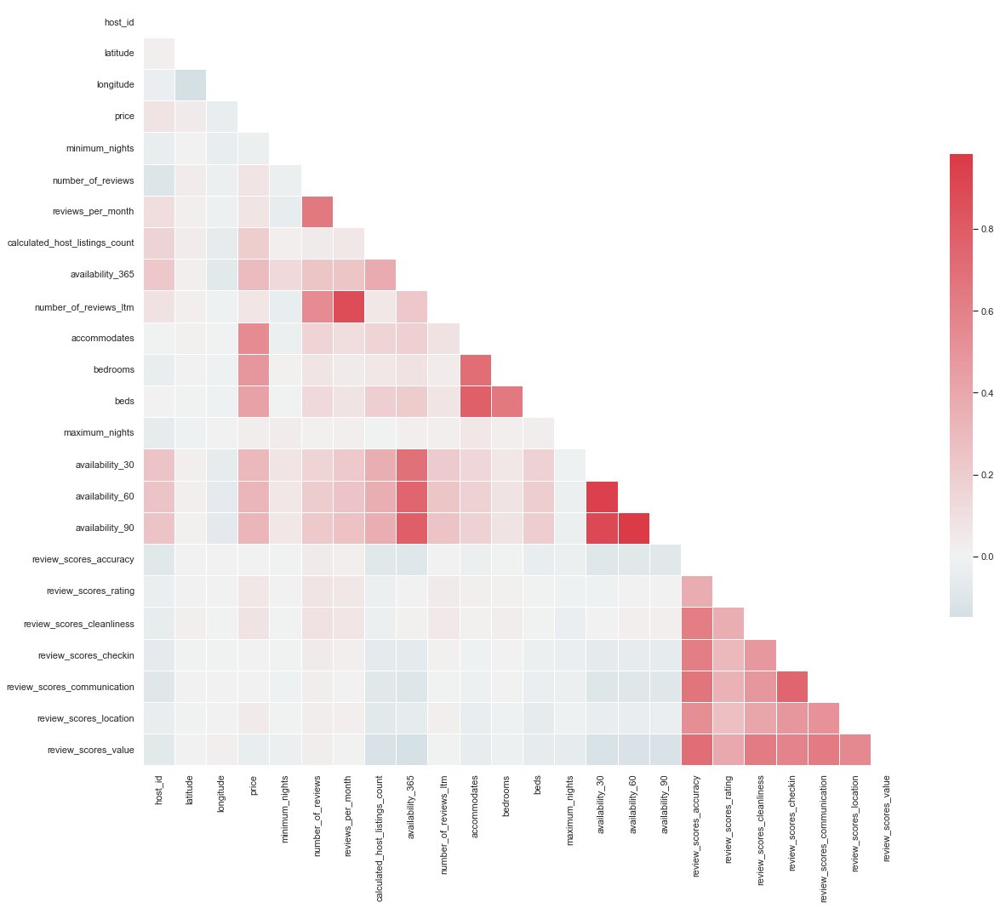

In [534]:
multi_collinearity_heatmap(df_listings_ols, figsize=(20,20))

In [535]:
df_listings_ols.columns

Index(['name', 'host_id', 'host_name', 'neighbourhood_group', 'neighbourhood',
       'latitude', 'longitude', 'room_type', 'price', 'minimum_nights',
       'number_of_reviews', 'reviews_per_month',
       'calculated_host_listings_count', 'availability_365',
       'number_of_reviews_ltm', 'license', 'property_type', 'description',
       'neighborhood_overview', 'accommodates', 'bedrooms', 'beds',
       'has_availability', 'maximum_nights', 'availability_30',
       'availability_60', 'availability_90', 'review_scores_accuracy',
       'review_scores_rating', 'review_scores_cleanliness',
       'review_scores_checkin', 'review_scores_communication',
       'review_scores_location', 'review_scores_value', 'accomodation_type'],
      dtype='object')

In [536]:
columns_multicollinearity = ['number_of_reviews_ltm','reviews_per_month','availability_60']
df_listings_ols = df_listings_ols.drop(columns_multicollinearity,axis=1)

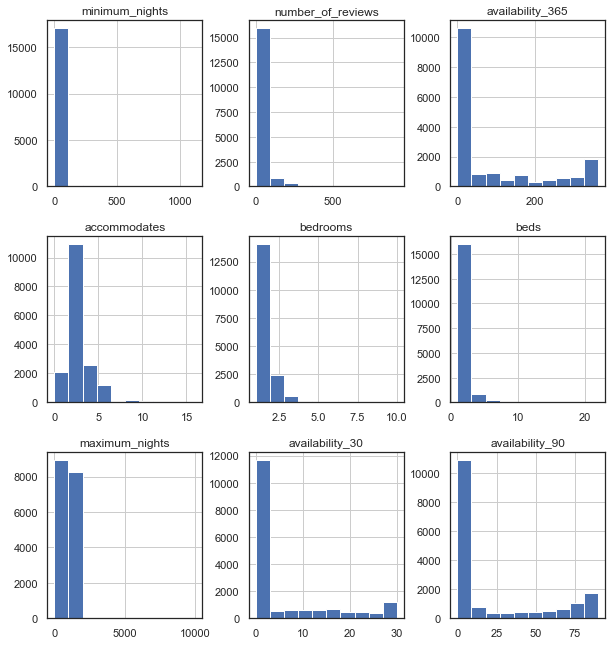

In [537]:
numerical_columns = [
        'minimum_nights', 'number_of_reviews',
        'availability_365', 'accommodates', 'bedrooms', 'beds',
        'maximum_nights', 'availability_30',
        'availability_90', 
       ]

df_listings_ols[numerical_columns].hist(figsize=(10,11));

### Standardising and normalising
Other than availability_90,availability_30,availability_365, and accommodates, the remaining numerical features are all postively skewed and could benefit from log transformation.



In [538]:
# Log transforming columns
numerical_columns = [i for i in numerical_columns 
                     if i not in ['availability_90','availability_30','availability_365', 'accommodates']]
# Removing items not to be transformed

for col in numerical_columns:
    df_listings_ols[col] = df_listings_ols[col].astype('float64').replace(0.0, 0.01) # Replacing 0s with 0.01
    df_listings_ols[col] = np.log(df_listings_ols[col])

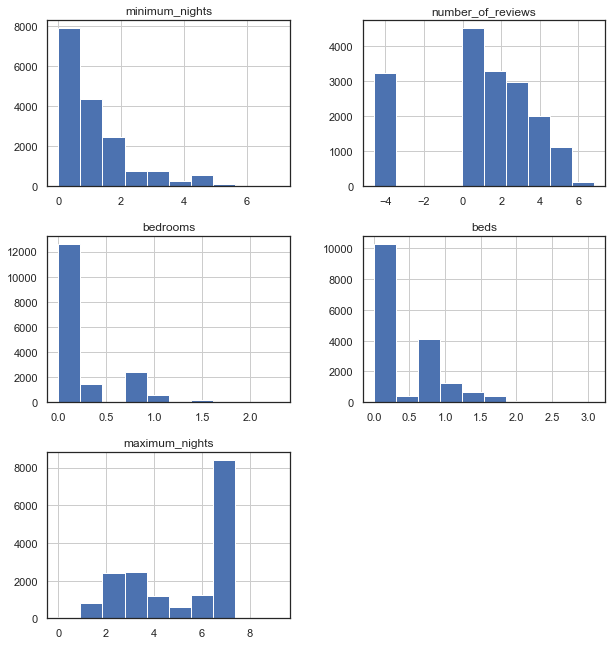

In [539]:
df_listings_ols[numerical_columns].hist(figsize=(10,11));

This appears to have helped some of the distributions.

In [540]:

X = df_listings_ols[['latitude', 'longitude','minimum_nights','bedrooms','beds','number_of_reviews','availability_30',
        'availability_90','availability_365','review_scores_rating',
       'review_scores_location','accomodation_type_int', 'neighbourhood_group_int', 
       'license_int']]

y = df_listings_ols['price']



KeyError: "['accomodation_type_int', 'neighbourhood_group_int', 'license_int'] not in index"

In [541]:
# Scaling
scaler = StandardScaler()
X = pd.DataFrame(scaler.fit_transform(X), columns=list(X.columns))

In [542]:
X.head()

,latitude,longitude,accommodates,bedrooms,beds,number_of_reviews,availability_30,accommodates,bedrooms,beds,availability_90,availability_365,review_scores_accuracy,review_scores_rating,review_scores_cleanliness,review_scores_checkin,review_scores_location,minimum_nights
0,0.705513,-0.020537,-0.443556,-0.456442,0.256462,2.246903,2.400219,-0.443556,-0.456442,0.256462,1.307164,1.884930,-0.002803,0.043397,-0.259302,0.162579,0.595806,2.180630
1,0.756506,0.204265,0.808529,-0.456442,0.256462,2.303034,-0.595448,0.808529,-0.456442,0.256462,-0.670484,0.660038,-0.305383,0.001554,-0.237783,-0.546531,0.476959,2.235433
2,1.011467,0.160448,-0.443556,-0.456442,0.256462,5.034765,-0.595448,-0.443556,-0.456442,0.256462,-0.670484,-0.674780,0.162240,0.280508,0.558423,0.103486,0.447247,-0.258111
3,0.694455,0.203472,2.686657,4.662007,4.371426,-0.297724,-0.595448,2.686657,4.662007,4.371426,-0.670484,-0.674780,0.574849,0.517620,0.773614,0.517134,0.298687,-0.121103
4,1.168744,-0.024982,-1.069599,0.007667,-0.566530,0.039065,1.437326,-1.069599,0.007667,-0.566530,-0.083370,0.573668,0.574849,0.057345,0.429308,-0.428346,-0.533244,2.317638


## Modeling

In [543]:
X_train , X_test, y_train, y_test = train_test_split(X,y,test_size=0.15,random_state=5)

In [544]:
hpm_reg = LinearRegression()  
hpm_reg.fit(X_train, y_train) #training the algorithm

# Now that the model has been fit we can make predictions by calling 
# the predict command. We are making predictions on the testing set:
training_preds_hpm_reg = hpm_reg.predict(X_train)
val_preds_hpm_reg = hpm_reg.predict(X_test)


#print(f"Time taken to run: {round((hpm_reg_end - hpm_reg_start)/60,1)} minutes")

# Check the predictions against the actual values by using the MSE and R-2 metrics:
print("\nTraining RMSE:", round(mean_squared_error(y_train, training_preds_hpm_reg),4))
print("Validation RMSE:", round(mean_squared_error(y_test, val_preds_hpm_reg),4))
print("\nTraining r2:", round(r2_score(y_train, training_preds_hpm_reg),4))
print("Validation r2:", round(r2_score(y_test, val_preds_hpm_reg),4))


Training RMSE: 1740.4852
Validation RMSE: 1944.7798

Training r2: 0.3963
Validation r2: 0.4164


<a id='model3'></a>
##  XGboost decision trees model.

[back to start](#start)

**Model 2: Gradient boosted decision trees**
<br> Boosting is an ensemble technique where new models are added to correct the errors made by existing models. Models are added sequentially until no further improvements can be made. A popular example is the AdaBoost algorithm that weights data points that are hard to predict.

Gradient boosting is an approach where new models are created that predict the residuals or errors of prior models and then added together to make the final prediction. It is called gradient boosting because it uses a gradient descent algorithm to minimize the loss when adding new models.

XGBoost (eXtreme Gradient Boosting) is an implementation of gradient boosted decision trees designed for speed and performance. Is a very popular algorithm that has recently been dominating applied machine learning for structured or tabular data.

This approach supports both regression and classification predictive modeling problems. For more information see here to listen to Tianqi Chen, the creator of the XGBoost library.

This model will most likely provide the best achievable accuracy and a measure of feature importance compared to our Hedonic regression (other than possible small accuracy increases from hyper-parameter tuning) due to XGBoost's superior performance.

In [630]:
df_listings_xgb = df_listings.copy()

In [631]:
X = df_listings_xgb[['latitude', 'longitude','accommodates','bedrooms','beds','number_of_reviews','availability_30',
        'availability_365',
       'review_scores_accuracy',
       'review_scores_rating', 'review_scores_cleanliness',      
       'review_scores_location', 'review_scores_value', 'accomodation_type','neighbourhood_group','license']]


In [632]:
X = pd.get_dummies(X)
X.head()

,latitude,longitude,accommodates,bedrooms,beds,number_of_reviews,availability_30,availability_365,review_scores_accuracy,review_scores_rating,...,neighbourhood_group_Mitte,neighbourhood_group_Neukölln,neighbourhood_group_Pankow,neighbourhood_group_Reinickendorf,neighbourhood_group_Spandau,neighbourhood_group_Steglitz - Zehlendorf,neighbourhood_group_Tempelhof - Schöneberg,neighbourhood_group_Treptow - Köpenick,license_no,license_yes
id,,,,,,,,,,,,,,,,,,,,,
2015,52.53305,13.40394,2,1.000000,2.0,144,28,326,4.79,4.66,...,1,0,0,0,0,0,0,0,1,0
3176,52.53471,13.41810,4,1.000000,2.0,147,0,170,4.68,4.63,...,0,0,1,0,0,0,0,0,1,0
7071,52.54301,13.41534,2,1.000000,2.0,293,0,0,4.85,4.83,...,0,0,1,0,0,0,0,0,1,0
9991,52.53269,13.41805,7,4.000000,7.0,8,0,0,5.00,5.00,...,0,0,1,0,0,0,0,0,0,1
14325,52.54813,13.40366,1,1.272021,1.0,26,19,159,5.00,4.67,...,0,0,1,0,0,0,0,0,1,0


In [633]:
y = df_listings_xgb['price']

In [634]:
X_train , X_test, y_train, y_test = train_test_split(X,y,test_size=0.15,random_state=21)

In [635]:
xgb_reg = xgb.XGBRegressor()
xgb_reg.fit(X_train, y_train)
training_preds_xgb_reg = xgb_reg.predict(X_train)
val_preds_xgb_reg = xgb_reg.predict(X_test)


print("\nTraining MSE:", round(mean_squared_error(y_train, training_preds_xgb_reg),4))
print("Validation MSE:", round(mean_squared_error(y_test, val_preds_xgb_reg),4))
print("\nTraining r2:", round(r2_score(y_train, training_preds_xgb_reg),4))
print("Validation r2:", round(r2_score(y_test, val_preds_xgb_reg),4))


Training MSE: 522.0217
Validation MSE: 1278.9372

Training r2: 0.8232
Validation r2: 0.5665


### XGB model variation 2

In [749]:
X = df_listings_xgb[['latitude', 'longitude','accommodates','bedrooms','beds','number_of_reviews','availability_30','availability_60','availability_90',
       'review_scores_accuracy',
       'review_scores_rating', 'review_scores_cleanliness',      
       'review_scores_location', 'review_scores_value', 'accomodation_type','license']]


In [750]:
X = pd.get_dummies(X)
X.head()

,latitude,longitude,accommodates,bedrooms,beds,number_of_reviews,availability_30,availability_60,availability_90,review_scores_accuracy,...,review_scores_cleanliness,review_scores_location,review_scores_value,accomodation_type_,accomodation_type_entire home & private_room,accomodation_type_entire_home,accomodation_type_private_room,accomodation_type_shared_room,license_no,license_yes
id,,,,,,,,,,,,,,,,,,,,,
2015,52.53305,13.40394,2,1.000000,2.0,144,28,58,64,4.79,...,4.52,4.96,4.58,0,0,1,0,0,1,0
3176,52.53471,13.41810,4,1.000000,2.0,147,0,0,0,4.68,...,4.53,4.92,4.63,0,0,1,0,0,1,0
7071,52.54301,13.41534,2,1.000000,2.0,293,0,0,0,4.85,...,4.90,4.91,4.71,0,0,0,1,0,1,0
9991,52.53269,13.41805,7,4.000000,7.0,8,0,0,0,5.00,...,5.00,4.86,4.86,0,0,1,0,0,0,1
14325,52.54813,13.40366,1,1.272021,1.0,26,19,19,19,5.00,...,4.84,4.58,4.42,0,0,1,0,0,1,0


In [751]:
X_train , X_test, y_train, y_test = train_test_split(X,y,test_size=0.15,random_state=21)

In [752]:
y = df_listings_xgb['price']

In [753]:
xgb_reg = xgb.XGBRegressor()
xgb_reg.fit(X_train, y_train)
training_preds_xgb_reg = xgb_reg.predict(X_train)
val_preds_xgb_reg = xgb_reg.predict(X_test)


print("\nTraining MSE:", round(mean_squared_error(y_train, training_preds_xgb_reg),4))
print("Validation MSE:", round(mean_squared_error(y_test, val_preds_xgb_reg),4))
print("\nTraining r2:", round(r2_score(y_train, training_preds_xgb_reg),4))
print("Validation r2:", round(r2_score(y_test, val_preds_xgb_reg),4))


Training MSE: 509.7269
Validation MSE: 1255.6113

Training r2: 0.8273
Validation r2: 0.5744


In [754]:
#multi_collinearity_heatmap(X, figsize=(20,20))

<a id='results'></a>
### Results:

[back to start](#start)

#### This means that our features explain approximately 57%(randome state = 21) of the variance in our target variable.

Feature importance
Apart from its superior performance, a benefit of using ensembles of decision tree methods like gradient boosting is that they can automatically provide estimates of feature importance from a trained predictive model.

Generally, importance provides a score that indicates how useful or valuable each feature was in the construction of the boosted decision trees within the model. The more an attribute is used to make key decisions with decision trees, the higher its relative importance.

This importance is calculated explicitly for each attribute in the dataset, allowing attributes to be ranked and compared to each other.

Importance is calculated for a single decision tree by the amount that each attribute split point improves the performance measure, weighted by the number of observations the node is responsible for. The performance measure may be the purity (Gini index) used to select the split points or another more specific error function.

The feature importances are then averaged across all of the the decision trees within the model.

For more detailed information on how feature importance is calculated in boosted decision trees, see this answer in StackOverflow.

In [755]:
ft_weights_xgb_reg = pd.DataFrame(xgb_reg.feature_importances_, columns=['weight'], index=X_train.columns)
ft_weights_xgb_reg.sort_values('weight', ascending=True, inplace=True)
ft_weights_xgb_reg.head(15)

,weight
license_yes,0.000000
review_scores_accuracy,0.009922
accomodation_type_entire home & private_room,0.010949
review_scores_cleanliness,0.014603
beds,0.015677
review_scores_value,0.017339
review_scores_location,0.018464
latitude,0.018531
number_of_reviews,0.019131
longitude,0.019688


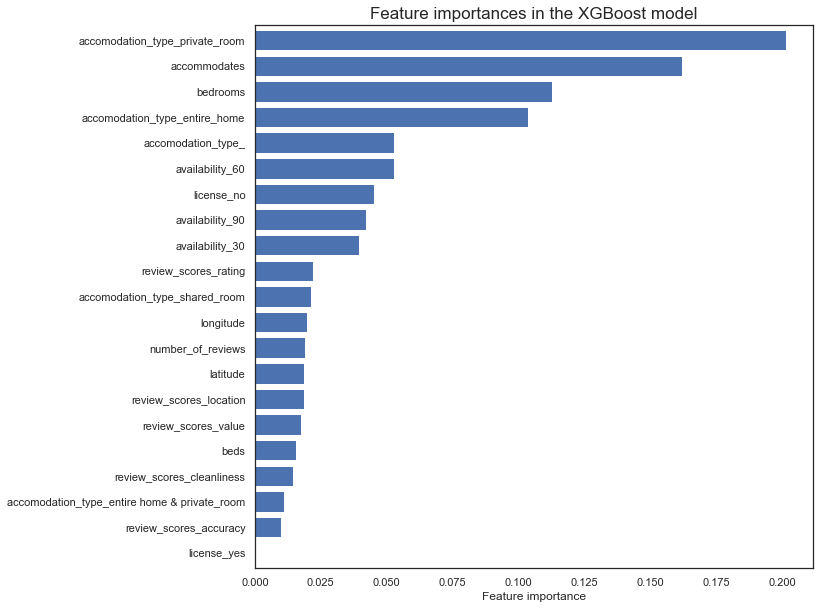

In [756]:
# Plotting feature importances
plt.figure(figsize=(10,10))
plt.barh(ft_weights_xgb_reg.index, ft_weights_xgb_reg.weight, align='center') 
plt.title("Feature importances in the XGBoost model", fontsize=17)
plt.xlabel("Feature importance")
plt.margins(y=0.01)
plt.show()




**The top 10 most important features are:**

<br> 1.Accomodation type (entire unit, private room, shared room)
<br> 2.number of accommodates
<br> 3.number of bedrooms
<br> 4.availability for upcoming 60 days
<br> 5.whether host has a license or not
<br> 6.review_score_rating
<br> 7.number of reviews
<br> 8.review_score_cleanliness
<br> 9.review_score_value
<br> 10. review_score_location
<br> 11. number of beds

The most important features the rental being the entire flat. Which makes sense. Asking price is higher if the offer is for the entire flat/house. This could also suggest that offering the flat/house as a whole, rather than each bedroom individually, may be better overall, given the large difference in importance compared to the second most important feature.

It is not surprising that the second how many people the property accommodates, as that's one of the main things you would use to search for properties with in the first place.

<a id='question3'></a>
## Business Question 3: What highly rated neighbourhoods in Berlin have to offer ? Whhat description of highly priced places tell the customer?

[back to start](#start)

In [228]:
# Standard libraries
import re
import pickle


# Import submodules
from os import path, getcwd
import nltk
from nltk.corpus import stopwords
from nltk.stem.wordnet import WordNetLemmatizer
from nltk.tokenize import word_tokenize
from wordcloud import WordCloud
from shapely.geometry import shape, Point
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score
from PIL import Image

# Download nltk infos
nltk.download('stopwords', quiet=True)
nltk.download('punkt', quiet=True)
nltk.download('wordnet', quiet=True);

In [229]:
# Create STOPWORDS for all languages
STOPWORDS = [stopword for stopword_list in [stopwords.words(lang) for lang in stopwords.fileids()] for stopword in stopword_list]


In [230]:
# Function to tokenize text
def tokenize(text):
    '''
    Tokenize text for creating features to train and test model
    by removing non-alphanumeric parts, lowering, 
    tokenizing and lemmatizing ignoring stopwords
    
    Parameters:
        text: string (as single words)
    Returns:
        tokens: string (as single words)
    '''
    
    # define stop_words and lemmatizer 
    stop_words = stopwords.words("english")
    lemmatizer = WordNetLemmatizer()
    
    # normalize case and remove punctuation
    #text = re.sub(r"[^a-zA-Z0-9]", " ", text.lower())
    text = re.sub(r"[^a-zA-ZÄÖÜäöüßéèê]", " ", text.lower())
    
    # tokenize text
    tokens = word_tokenize(text)
    
    # lemmatize and remove stop words in tokens
    tokens = [lemmatizer.lemmatize(word) for word in tokens if word not in STOPWORDS]
    
    return tokens

In [231]:
# Function to tokenize string of text
def tokenized_string(text):
    '''
    Create joint string of single tokens from each sentence/neighbourhood description
    
    Parameters:
        text: string (as string of single words)
    Returns:
        result: string (as string of single words)
    '''
    
    # Tokenize text
    tokens = tokenize(text)
    
    # Join tokens to result
    result = " ".join(tokens)
    
    return result

In [255]:
# Function to create a wordcloud
def create_word_cloud(df=df_listings['neighborhood_overview'], mask=None, contour_color='white', contour_width=0):
    '''
    Parameters:
        neighbourhood (optional): restrict descriptions to neighbourhood, else all neighbourhoods
        mask (optional): np.array as mask
        contour_color (optional): 'white' or else
        contour_width (optional): 0 or else as contour_width
    Returns:
        None (but plots wordcloud)
    '''
    
    # Select description for neighbourhood (if given)
#     if neighbourhood:
#         descriptions = df_listings[df_listings['neighbourhood_group'] == neighbourhood]['neighborhood_overview'].dropna()
#     else:
#         descriptions = df_listings['neighbourhood_overview'].dropna()
    
    descriptions = df.dropna()

    # Create bag-of-words (array of all words for each description)
    text = descriptions.apply(tokenized_string).values
    
    # Create wordcloud
    wordcloud=WordCloud( 
        mask=mask,
        max_words=1000,
        max_font_size=100,
        width=810,
        height=613,
        background_color='white',
        contour_color=contour_color,
        contour_width=contour_width,
        colormap='Dark2', 
        random_state=42).generate(str(text))
    
    # Setup plot
    plt.figure(
        figsize=(8, 6),
        facecolor='white',
        edgecolor='white')
    
    # Plot wordcloud
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    
    plt.tight_layout(pad=0)
    
    return plt

<a id='neighbourhoods'></a>
### Neighbourhoods: 


[back to start](#start)

In [264]:
df_listings['neighbourhood_group'].unique()

array(['Mitte', 'Pankow', 'Friedrichshain-Kreuzberg', 'Neukölln',
       'Charlottenburg-Wilm.', 'Tempelhof - Schöneberg', 'Reinickendorf',
       'Steglitz - Zehlendorf', 'Lichtenberg', 'Treptow - Köpenick',
       'Marzahn - Hellersdorf', 'Spandau'], dtype=object)

In [274]:
df_listings['neighbourhood'].unique()

array(['Brunnenstr. Süd', 'Prenzlauer Berg Südwest', 'Helmholtzplatz',
       'Prenzlauer Berg Nordwest', 'nördliche Luisenstadt',
       'Reuterstraße', 'Tempelhofer Vorstadt', 'Prenzlauer Berg Süd',
       'Moabit Ost', 'Halensee', 'Schöneberg-Nord', 'Regierungsviertel',
       'südliche Luisenstadt', 'Frankfurter Allee Süd FK',
       'Neue Kantstraße', 'Brunnenstr. Nord', 'Prenzlauer Berg Nord',
       'Kantstraße', 'Schmargendorf', 'Alexanderplatz',
       'Blankenfelde/Niederschönhausen', 'Schillerpromenade',
       'Frankfurter Allee Nord', 'Schöneberg-Süd',
       'Südliche Friedrichstadt', 'Moabit West', 'Wiesbadener Straße',
       'Rixdorf', 'Blankenburg/Heinersdorf/Märchenland', 'Ost 2',
       'Pankow Zentrum', 'Zehlendorf  Nord', 'Prenzlauer Berg Ost',
       'Buckow Nord', 'Pankow Süd', 'Karlshorst', 'Karl-Marx-Allee-Nord',
       'Düsseldorfer Straße', 'Rudow', 'Otto-Suhr-Allee',
       'Mierendorffplatz', 'Wedding Zentrum', 'Karl-Marx-Allee-Süd',
       'Altglienicke',

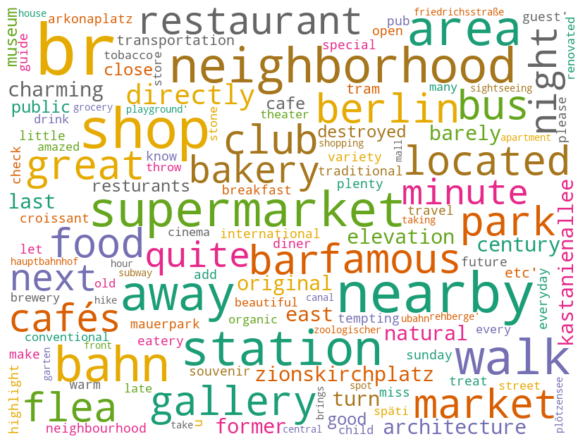

In [257]:
# Create wordcloud for all Neighbourhoods
create_word_cloud(df_listings['neighborhood_overview']);

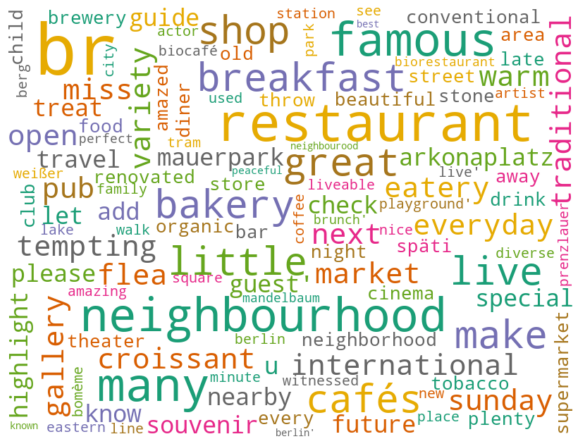

In [258]:
# Create wordcloud for Pankow
create_word_cloud(df = df_listings[df_listings.neighbourhood_group == 'Pankow']['neighborhood_overview']);

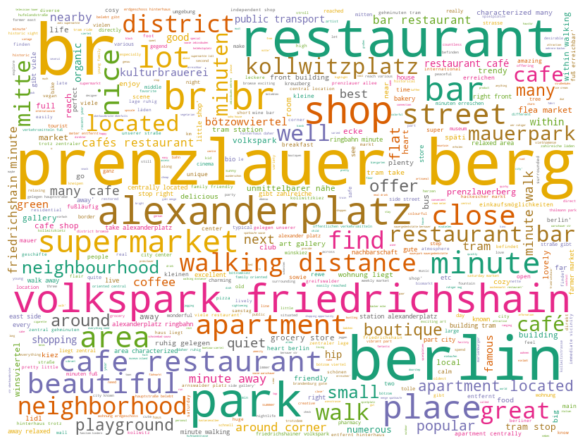

In [275]:
# Create wordcloud for 'Prenzlauer Berg Süd'
create_word_cloud(df = df_listings[df_listings.neighbourhood == 'Prenzlauer Berg Süd']['neighborhood_overview']);



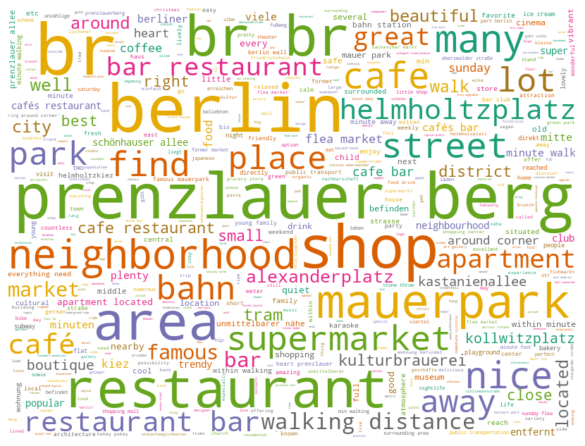

In [276]:
# Create wordcloud for 'Helmholtzplatz'
create_word_cloud(df = df_listings[df_listings.neighbourhood == 'Helmholtzplatz']['neighborhood_overview']);



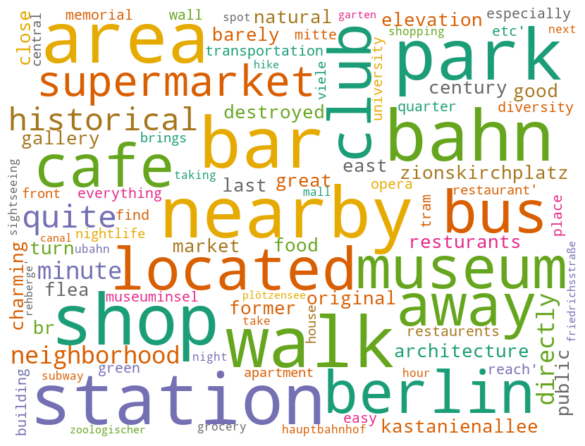

In [259]:
# Create wordcloud for Mitte
create_word_cloud(df = df_listings[df_listings.neighbourhood_group == 'Mitte']['neighborhood_overview']);

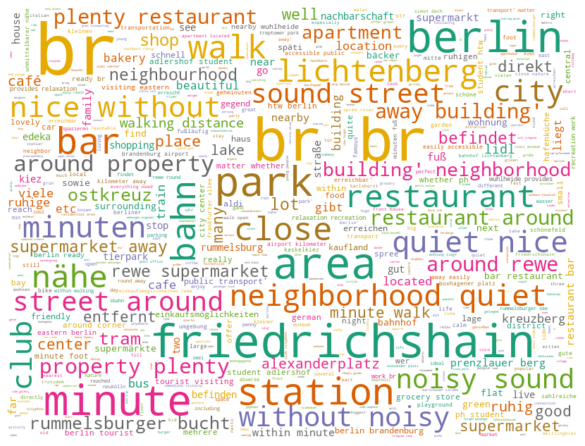

In [260]:
# Create wordcloud for Lichtenberg
create_word_cloud(df = df_listings[df_listings.neighbourhood_group == 'Lichtenberg']['neighborhood_overview']);

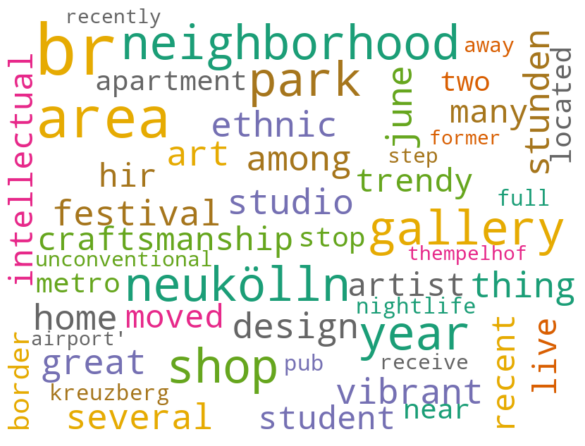

In [263]:
# Create wordcloud for Neukölln
create_word_cloud(df = df_listings[df_listings.neighbourhood_group == 'Neukölln']['neighborhood_overview']);


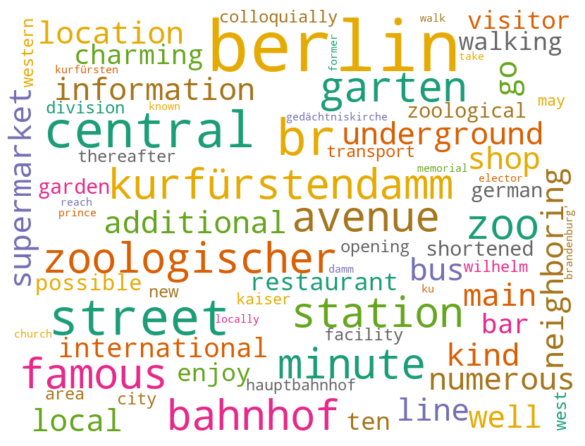

In [265]:
# Create wordcloud for Charlottenburg-Wilm.
create_word_cloud(df = df_listings[df_listings.neighbourhood_group == 'Charlottenburg-Wilm.']['neighborhood_overview']);


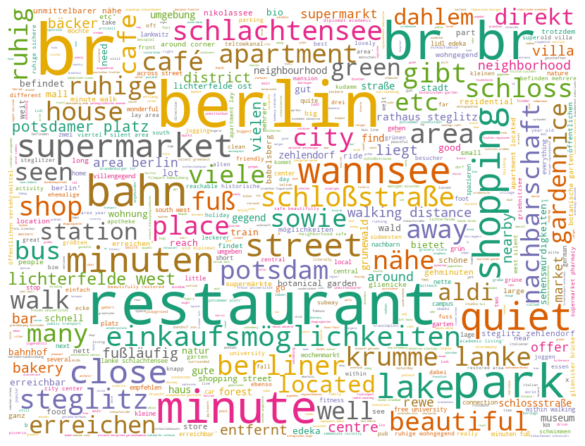

In [268]:
# Create wordcloud for 'Steglitz - Zehlendorf'
create_word_cloud(df = df_listings[df_listings.neighbourhood_group == 'Steglitz - Zehlendorf']['neighborhood_overview']);


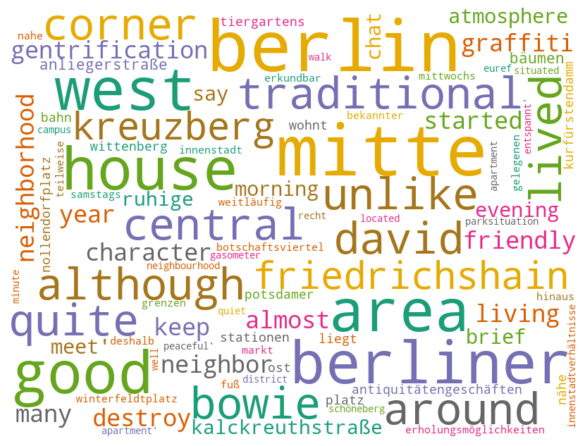

In [269]:
# Create wordcloud for 'Tempelhof - Schöneberg'
create_word_cloud(df = df_listings[df_listings.neighbourhood_group == 'Tempelhof - Schöneberg']['neighborhood_overview']);


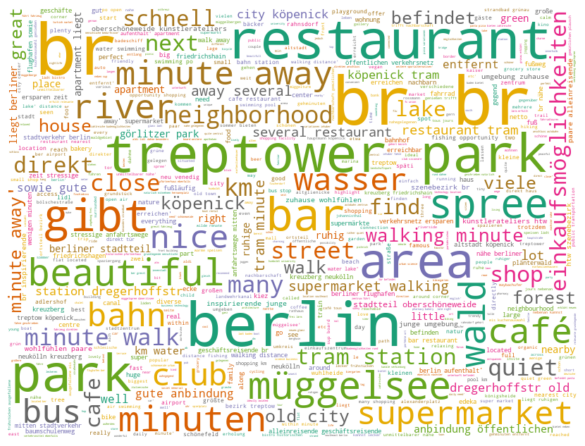

In [270]:
# Create wordcloud for 'Treptow - Köpenick'
create_word_cloud(df = df_listings[df_listings.neighbourhood_group == 'Treptow - Köpenick']['neighborhood_overview']);


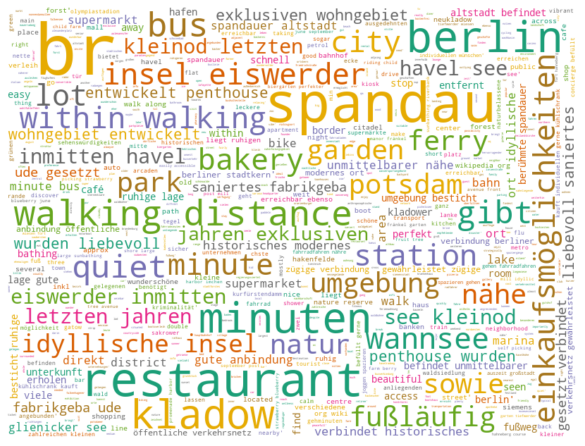

In [271]:
# Create wordcloud for Spandau
create_word_cloud(df = df_listings[df_listings.neighbourhood_group == 'Spandau']['neighborhood_overview']);


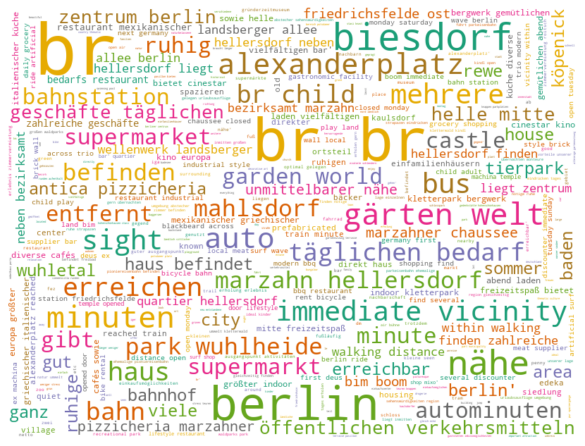

In [272]:
# Create wordcloud for 'Marzahn - Hellersdorf'
create_word_cloud(df = df_listings[df_listings.neighbourhood_group == 'Marzahn - Hellersdorf']['neighborhood_overview']);


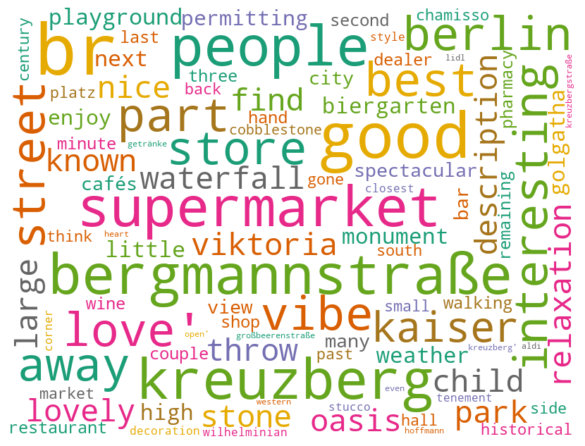

In [273]:
# Create wordcloud for 'Friedrichshain-Kreuzberg'
create_word_cloud(df = df_listings[df_listings.neighbourhood_group == 'Friedrichshain-Kreuzberg']['neighborhood_overview']);


In [315]:

description_wordcloud = categories.merge(df_listings[['description','name','neighbourhood','accomodation_type']],how='inner', left_index=True, right_index=True)



<a id='places'></a>
### Highly priced places descriptions:

[back to start](#start)

In [318]:
description_wordcloud.accomodation_type.unique()

array(['entire_home', 'private_room', 'entire home & private_room',
       'shared_room', ''], dtype=object)

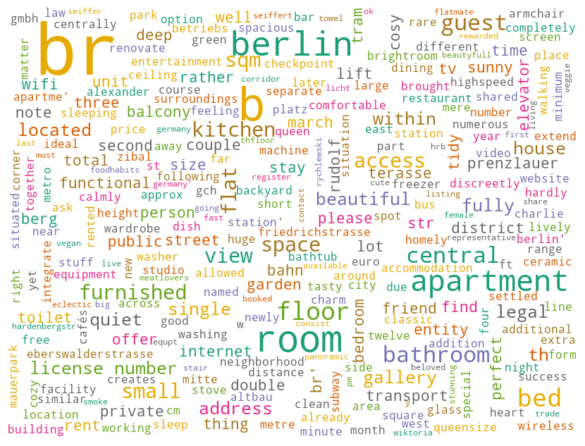

In [336]:

# Create wordcloud for description of a lowest priced place
create_word_cloud(df = description_wordcloud[description_wordcloud.price_category==4]['description']);

- word room is dominant over word apartment
- no destinctive pattern of specific words, 
- furnished, floor, central, bathroom

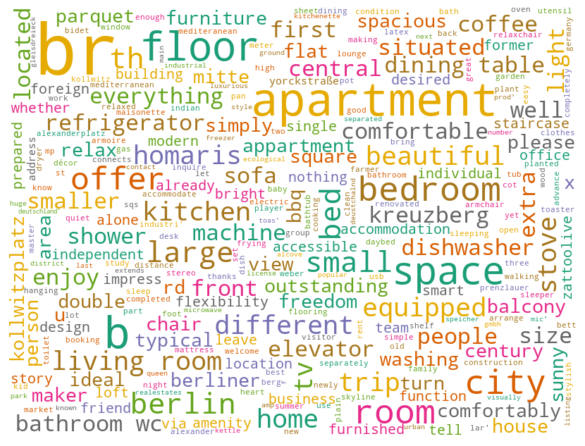

In [335]:
# Create wordcloud for description of a highly priced place
create_word_cloud(df = description_wordcloud[description_wordcloud.price_category==1]['description']);

- apartment
- space, living room , large, spacious
- floor, parquet, design
- equipped kitchen : dishwasher, elevator, tv, zattoolive, refrigerator, everything, dinning table
- homaris apartments
- central situated
- kreuzberg, kollwitzplatz, mitte
- outstanding, beautiful, comfortable, light
- people , freedom, bbq

In [770]:
df_listings['room_type'].unique() 

array(['Entire home/apt', 'Private room', 'Shared room', 'Hotel room'],
      dtype=object)

'Camper/RV', 
       ,'Houseboat', 'Boat','Entire bungalow', 'Entire cottage','Entire chalet', 'Entire cabin', 'Castle', 

### How named highly  priced units?

<a id= 'question4'></a>
## Q4. What are those extraordinary highly profitable units and what makes them triple their monthly earnings in comparison to the rest nicely located listings?

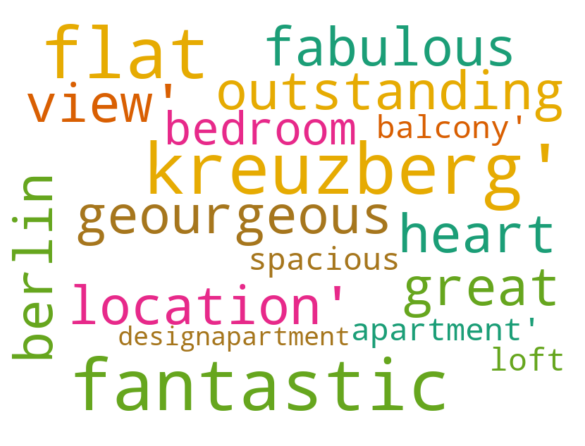

In [328]:
# Create wordcloud for NAME of a highly priced place
create_word_cloud(df = description_wordcloud[(description_wordcloud.price_category==1)]['name']);


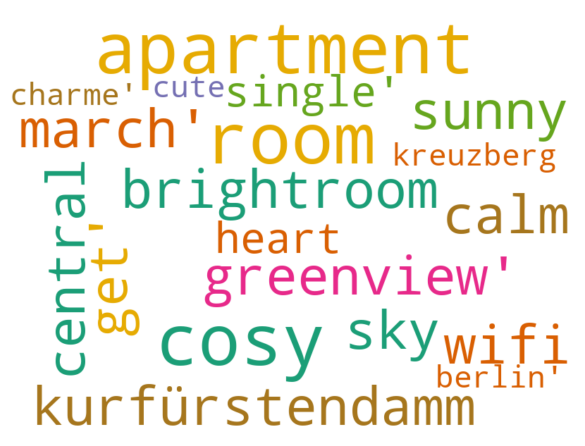

In [432]:
# Create wordcloud for NAME of a the lowest priced place
create_word_cloud(df = description_wordcloud[description_wordcloud.price_category==4]['name']);

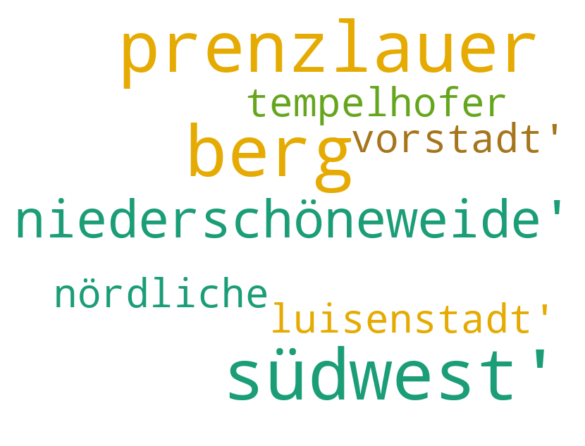

In [333]:
# Create wordcloud for NEIHGBOURHOOD of a highly priced place
create_word_cloud(df = description_wordcloud[description_wordcloud.price_category==1]['neighbourhood']);

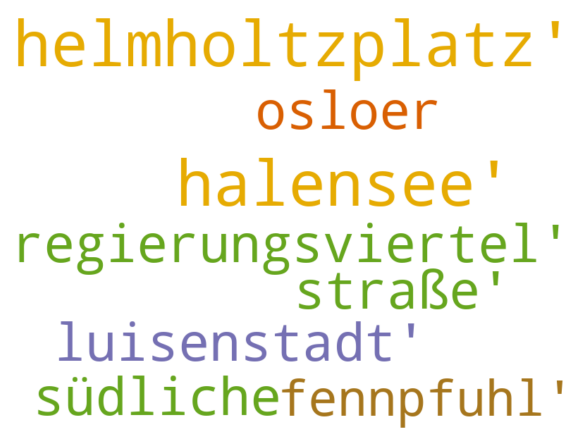

In [334]:
# Create wordcloud for NEIHGBOURHOOD of a highly priced place
create_word_cloud(df = description_wordcloud[description_wordcloud.price_category==4]['neighbourhood']);

In [771]:
df_listings_categories = df_listings.merge(categories[[  'price_category', 'reviews_score_category', 'location_score_category']], how = 'inner', left_index=True, right_index=True)

In [772]:
# share of highly priced units
df_listings_categories[df_listings_categories.price> 100].shape[0]/df_listings_categories.shape[0]

0.16271501627150162

In [773]:
# average price of highly priced listings 
df_listings_categories[df_listings_categories.price> 100].price.mean() 

163.49714285714285

In [774]:
#price ange of highly priced listings 
df_listings_categories[df_listings_categories.price> 100].price.min() , df_listings_categories[df_listings_categories.price_category==1].price.max() 


(101, 500)

In [775]:
df_listings_gz = df_listings_gz.set_index('id')

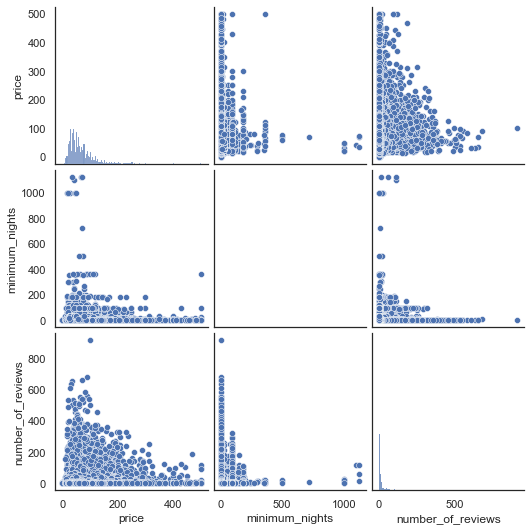

In [776]:
sns.pairplot(df_listings_categories[['price','minimum_nights','number_of_reviews']]);




In [777]:
df_listings_categories = df_listings_categories.merge(df_listings_gz[['listing_url','picture_url','host_url','host_about']], how = 'inner',
                             left_index=True, right_index=True) 
                             
                             

In [778]:
df_listings_categories[df_listings_categories.price> 100].shape[0]

2800

In [779]:
df_listings_categories[df_listings_categories.price> 100].host_id.nunique()

1978

In [780]:
#df_listings_categories[df_listings_categories.price_category==1].host_about.nunique()

In [392]:
#df_listings_categories[df_listings_categories.price_category==1].isnull().sum() 

In [424]:
df_listings_categories[df_listings_categories.price> 100].groupby(['host_id','host_name']).size().sort_values(ascending=False)[:30]


host_id    host_name                  
335573202  Downtown Apartments            44
210700814  Downtown Apartments Berlin     40
76954154   WalQinn                        38
3003519    Simon                          30
421235453  The                            21
342965     Matthew                        15
23904144   Katarina                       14
415771368  The Circus Hotel               14
190957759  Stella                         14
1496069    Oliver                         13
4032095    Heinz                          12
155105708  Sören                          12
87442687   Babett                         11
1194258    Stefan                         11
372068633  Marcin                         11
718939     Martina & Charlotte (MaCha)    10
318912597  The Circus Apartments          10
217378709  Visionapartments                9
102979040  Team Suite030                   9
167881332  Eugen                           9
1210739    TRIO Apartment Hotel            8
151200     Brill

In [423]:
df_listings_categories[(df_listings_categories.price>= 100)&(df_listings_categories.host_name=='Simon')]

,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,...,reviews_score_category,location_score_category,listing_url_x,picture_url_x,host_url_x,host_about_x,listing_url_y,picture_url_y,host_url_y,host_about_y
id,,,,,,,,,,,,,,,,,,,,,
9536912,Premium Loft-Apartment (150sqm) with Terrace,3003519,Simon,Mitte,Moabit West,52.532920,13.326820,Entire home/apt,239,2,...,2,4,https://www.airbnb.com/rooms/9536912,https://a0.muscache.com/pictures/9360f015-9278...,https://www.airbnb.com/users/show/3003519,"""The World Is a Book and Those Who Do Not Trav...",https://www.airbnb.com/rooms/9536912,https://a0.muscache.com/pictures/9360f015-9278...,https://www.airbnb.com/users/show/3003519,"""The World Is a Book and Those Who Do Not Trav..."
9585301,Cozy flat in the heart of Kreuzberg,25090768,Simon,Friedrichshain-Kreuzberg,südliche Luisenstadt,52.494690,13.437200,Entire home/apt,150,1,...,2,4,https://www.airbnb.com/rooms/9585301,https://a0.muscache.com/pictures/2b9dadf9-e5e0...,https://www.airbnb.com/users/show/25090768,NaN,https://www.airbnb.com/rooms/9585301,https://a0.muscache.com/pictures/2b9dadf9-e5e0...,https://www.airbnb.com/users/show/25090768,NaN
16237757,Interior Designed Three Bedroom Loft-Apartment...,3003519,Simon,Mitte,Moabit West,52.533000,13.326880,Entire home/apt,176,2,...,2,4,https://www.airbnb.com/rooms/16237757,https://a0.muscache.com/pictures/5d9ee3b2-db2f...,https://www.airbnb.com/users/show/3003519,"""The World Is a Book and Those Who Do Not Trav...",https://www.airbnb.com/rooms/16237757,https://a0.muscache.com/pictures/5d9ee3b2-db2f...,https://www.airbnb.com/users/show/3003519,"""The World Is a Book and Those Who Do Not Trav..."
16250536,Loft Apartment (85sqm) with 2 Bedrooms & Balcony,3003519,Simon,Mitte,Moabit West,52.533000,13.326880,Entire home/apt,197,2,...,2,4,https://www.airbnb.com/rooms/16250536,https://a0.muscache.com/pictures/ed3ff733-8e5e...,https://www.airbnb.com/users/show/3003519,"""The World Is a Book and Those Who Do Not Trav...",https://www.airbnb.com/rooms/16250536,https://a0.muscache.com/pictures/ed3ff733-8e5e...,https://www.airbnb.com/users/show/3003519,"""The World Is a Book and Those Who Do Not Trav..."
16252509,3-Bedroom Design Apartment (110sqm) with Balcony,3003519,Simon,Mitte,Moabit West,52.533000,13.326880,Entire home/apt,230,2,...,2,4,https://www.airbnb.com/rooms/16252509,https://a0.muscache.com/pictures/a76b1a76-8329...,https://www.airbnb.com/users/show/3003519,"""The World Is a Book and Those Who Do Not Trav...",https://www.airbnb.com/rooms/16252509,https://a0.muscache.com/pictures/a76b1a76-8329...,https://www.airbnb.com/users/show/3003519,"""The World Is a Book and Those Who Do Not Trav..."
16254081,Design Apartment (85sqm) with 2 Bedrooms & Ter...,3003519,Simon,Mitte,Moabit West,52.533000,13.326880,Entire home/apt,189,2,...,2,4,https://www.airbnb.com/rooms/16254081,https://a0.muscache.com/pictures/1072d3e5-8bff...,https://www.airbnb.com/users/show/3003519,"""The World Is a Book and Those Who Do Not Trav...",https://www.airbnb.com/rooms/16254081,https://a0.muscache.com/pictures/1072d3e5-8bff...,https://www.airbnb.com/users/show/3003519,"""The World Is a Book and Those Who Do Not Trav..."
16280687,Penthouse (115sqm) with 3 Bedrooms & Balcony,3003519,Simon,Mitte,Moabit West,52.533000,13.326880,Entire home/apt,184,2,...,2,4,https://www.airbnb.com/rooms/16280687,https://a0.muscache.com/pictures/dd038610-6c7e...,https://www.airbnb.com/users/show/3003519,"""The World Is a Book and Those Who Do Not Trav...",https://www.airbnb.com/rooms/16280687,https://a0.muscache.com/pictures/dd038610-6c7e...,https://www.airbnb.com/users/show/3003519,"""The World Is a Book and Those Who Do Not Trav..."
19153150,195 SQM & 5 BR - DESIGN APARTMENT // ENTIRE FLOOR,3003519,Simon,Mitte,Moabit West,52.532990,13.326840,Entire home/apt,422,2,...,2,4,https://www.airbnb.com/rooms/19153150,https://a0.muscache.com/pictures/438ba9f9-6bb7...,https://www.airbnb.com/users/show/

<a id="map"></a>
## Price map  by  Berlin distrincts

[back to start](#start)

In [559]:
#pip install altair

In [500]:
import geopandas as gpd
import altair as alt
import json

In [909]:
# reading gEO data into dataframe
gdf = gpd.read_file("/Users/katerynaisaieva/Desktop/Nanodegree_Projects/Data_Scientist_Nanodegree/Airbnb_project/Berlin/data/neighbourhoods.geojson")


(140, 3)


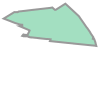

In [910]:
print(gdf.shape)
gdf.geometry[23]

In [999]:
#gdf.plot();

In [913]:
df = df_listings[['neighbourhood','neighbourhood_group','price','review_scores_location']]
df = df.groupby('neighbourhood')[['price','review_scores_location']].mean().reset_index()


In [914]:
df = gdf.merge(df[['neighbourhood','price','review_scores_location']], how='left', left_on='neighbourhood',right_on = 'neighbourhood')


In [1006]:
df

,neighbourhood,neighbourhood_group,geometry,price,review_scores_location
0,Blankenfelde/Niederschönhausen,Pankow,"MULTIPOLYGON (((13.41191 52.61487, 13.41183 52...",76.902439,4.710369
1,Helmholtzplatz,Pankow,"MULTIPOLYGON (((13.41405 52.54929, 13.41422 52...",75.363914,4.895056
2,Wiesbadener Straße,Charlottenburg-Wilm.,"MULTIPOLYGON (((13.30748 52.46788, 13.30743 52...",89.837838,4.733431
3,Schmöckwitz/Karolinenhof/Rauchfangswerder,Treptow - Köpenick,"MULTIPOLYGON (((13.70973 52.39630, 13.70926 52...",84.739130,4.635111
4,Müggelheim,Treptow - Köpenick,"MULTIPOLYGON (((13.73762 52.40850, 13.73773 52...",119.166667,4.844898
...,...,...,...,...,...
131,Adlershof,Treptow - Köpenick,"MULTIPOLYGON (((13.55429 52.42581, 13.55424 52...",71.179487,4.744318
133,Hellersdorf-Nord,Marzahn - Hellersdorf,"MULTIPOLYGON (((13.59619 52.53414, 13.59544 52...",68.538462,4.317364
136,Mahlsdorf,Marzahn - Hellersdorf,"MULTIPOLYGON (((13.65554 52.52982, 13.65693 52...",64.458333,4.694583
137,Ost 1,Reinickendorf,"MULTIPOLYGON (((13.36666 52.55823, 13.36561 52...",42.620000,4.465339


#### The geometry column contains the polygons which define the postal code’s shape.

We can use geopandas mapping tools to generate the map with the plot method.

In [1007]:
import folium
from folium.plugins import HeatMapWithTime
from folium.plugins import HeatMap
from datetime import datetime
from branca.colormap import linear
from matplotlib import cm

import geopy.distance
import requests
import json

In [1008]:
# look at breakdown of prices in different districts
df_listings_agg = df_listings.groupby('neighbourhood').agg({'price':['mean','median','std','count']})
df_listings_agg

price                         
                             mean median         std count
neighbourhood                                             
Adlershof               71.179487   77.0   34.223624    39
Albrechtstr.            55.987179   48.5   37.021753    78
Alexanderplatz          89.583247   78.0   57.736309   967
Allende-Viertel        108.000000   40.0  145.540372     4
Alt  Treptow            65.349593   52.0   55.085326   123
...                           ...    ...         ...   ...
Wilhelmstadt            67.294118   60.0   42.255736    34
Zehlendorf  Nord        76.083333   58.0   55.370338    60
Zehlendorf  Südwest     76.755556   75.0   38.444266    45
nördliche Luisenstadt   69.664474   55.0   49.319788   304
südliche Luisenstadt    69.663306   52.5   51.946608   496

[138 rows x 4 columns]

In [1009]:
df_listings_agg = df_listings_agg[df_listings_agg[('price',  'count')] >= 10]

In [1010]:
filter = df['neighbourhood'].isin(list(df_listings_agg.index))

In [1011]:
df = df[filter]
df = df[df.neighbourhood != 'Haselhorst']

### Mapping with Folium

In [1012]:
# make the colormap used for the folium plot of neighbourhood prices
# colormap = linear.GnBu_09.scale(
#     df.price.min(),
#     df.price.max())

In [1000]:
import branca
import branca.colormap as cm

In [1014]:
df.to_csv('map_berlin_folium.csv')

In [1001]:
colormap= cm.LinearColormap(
    ['purple','green','yellow', 'orange', 'red'],
    vmin=df.price.min(), vmax=df.price.max(),
    caption='Color Scale for Map' #Caption for Color scale or Legend
)

In [1002]:
# make map of average prices paid in each neighbourhood of Berlin

style_function = lambda x: {'weight': 0.5,
                           'fillColor': '#8c8c8c',
                           'fillOpacity': 0,
                           'color': 'black'} if pd.isnull(x['properties']['price'])else {'weight': 0.5,
                                                                                             'fillColor': colormap(x['properties']['price']),
                                                                                             'fillOpacity': .75,
                                                                                             'color': 'black'}

highlight_function = lambda x: {'weight': 0.5,
                           'fillColor': '#8c8c8c',
                           'fillOpacity': 0,
                           'color': 'black'} if pd.isnull(x['properties']['price']) else {'weight': 0.8,
                                                                                               'fillColor': colormap(x['properties']['price']),
                                                                                               'fillOpacity': 1,
                                                                                               'color': 'black'}

styles= folium.features.GeoJson(
    df,
    style_function=style_function,
    highlight_function = highlight_function,
    tooltip=folium.features.GeoJsonTooltip(
        fields=['neighbourhood','price']
        ))



In [1003]:
# make folium map centered in Berlin
m = folium.Map(location=[52.51, 13.40], zoom_start=10, tiles='cartodbpositron')

colormap.caption = 'Average Price Paid'
colormap.add_to(m)

m.add_child(styles)

In [996]:
colormap_group= cm.LinearColormap(
    ['red','yellow','lightblue','blue'],
    vmin=df.review_scores_location.min(), vmax=df.review_scores_location.max(),
    caption='Color Scale for Map' #Caption for Color scale or Legend
)

In [997]:
# make map of average prices paid in each neighbourhood of Berlin

style_function_group = lambda x: {'weight': 0.5,
                           'fillColor': '#8c8c8c',
                           'fillOpacity': 0,
                           'color': 'black'} if pd.isnull(x['properties']['review_scores_location'])else {'weight': 0.5,
                                                                                             'fillColor': colormap_group(x['properties']['review_scores_location']),
                                                                                             'fillOpacity': .75,
                                                                                             'color': 'black'}

highlight_function_group = lambda x: {'weight': 0.5,
                           'fillColor': '#8c8c8c',
                           'fillOpacity': 0,
                           'color': 'black'} if pd.isnull(x['properties']['review_scores_location']) else {'weight': 0.8,
                                                                                               'fillColor': colormap_group(x['properties']['review_scores_location']),
                                                                                               'fillOpacity': 1,
                                                                                                           'color': 'black'}
   



styles_group = folium.features.GeoJson(
    df,
    style_function=style_function_group,
    highlight_function = highlight_function_group,
    tooltip=folium.features.GeoJsonTooltip(
        fields=['neighbourhood','review_scores_location']
        ))



In [998]:
# make folium map centered in Berlin
m_group = folium.Map(location=[52.51, 13.40], zoom_start=10, tiles='cartodbpositron')

colormap_group.caption = 'Review score by location'
colormap_group.add_to(m_group)

m_group.add_child(styles_group)

plt.rcParams['figure.figsize'] = [16, 11]

### Mapping with Geopanda

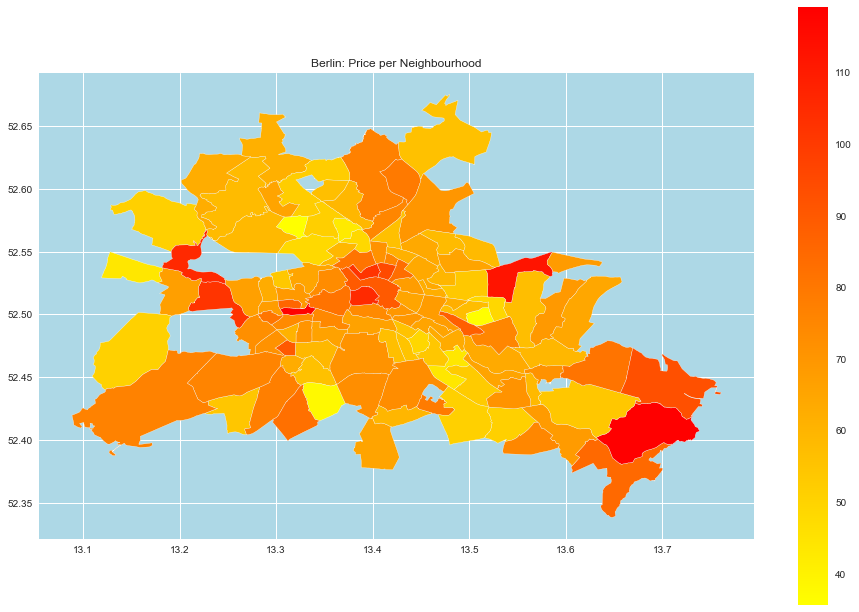

In [886]:
berlin_df = df

fig, ax = plt.subplots()

berlin_df.plot(
    ax=ax, 
    column='price', 
    categorical=False, 
    legend=True, 
    cmap='autumn_r',
)

ax.set(
    title='Berlin: Price per Neighbourhood', 
    aspect=1.3,
    facecolor='lightblue'
);

### Mapping with Altair

In [1004]:
# Function to plot map with colors encoding values from a certain column
def make_neighbourhood_chart(geo_data,  
               color_encoding,
               color_direction='descending'):
    '''
    Function to plot (altair-)map values of a certain column for each area
    
    Parameters:
        geo_data: geopandas dataframe containing geometry and values
        color_encoding: column to encode with columns
        color_direction: 'ascending' or 'descending'
    '''
    
    tooltip_low = ['neighbourhood']
    tooltip_full = [col for col in geo_data.columns if col != 'geometry']
    
    # Create base-chart without colors
    base_chart = alt.Chart(
        geo_data,
        width=600,
        height=450
    ).mark_geoshape(
        fill='white',
        stroke='grey'
    ).project(
    ).encode(
        tooltip=tooltip_low
    )
    
    # Create overlay/top-chart with color encodings
    top_chart = alt.Chart(
        geo_data
    ).mark_geoshape(
        stroke='grey'
    ).project(
    ).encode(
        color=alt.Color(
            color_encoding, 
            scale=alt.Scale(
                scheme='redyellowgreen'), 
            sort=color_direction,
            legend=alt.Legend(orient="bottom")),
        tooltip=tooltip_full
    )
    
    # Return altair-plot
    return base_chart + top_chart

In [1005]:
# Plot map with Weighted Average Score
make_neighbourhood_chart(df, 
           'price')

alt.LayerChart(...)